In [87]:
import lbcred, os, random, ccdproc
from lbcred import image, interactive, tools, reduce, detection, utils
from astropy.nddata import CCDData
import numpy as np
from astropy.stats import mad_std
import ccdproc, glob
from astropy.table import Column, Table, vstack
from lbcred import project_dir


%matplotlib inline
%config InlineBackend.figure_format='retina'

# New imports
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from astropy.io import fits
from astropy.stats import sigma_clip
from astropy import log
from astropy.modeling import models, fitting
from scipy.stats import chisquare
from astropy.io import ascii
import astromatic_wrapper as aw
from astropy.coordinates import SkyCoord
from matplotlib.lines import Line2D

from astropy import units as u
from astropy.time import Time
from astropy.coordinates import EarthLocation
from astropy.coordinates import Longitude, Latitude, AltAz

from photutils import CircularAperture
from photutils import aperture_photometry
from astropy.nddata import Cutout2D
from astropy.wcs import WCS
from matplotlib import colors

radii = np.arange(1,25)
chosen_aper = 7 # pixel radius

In [88]:
# Get images, run SE
in_dir = '/Users/kirstencasey/m81_astrometry_out/'

flux_apers = '1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20'
num_apers = len(utils.list_of_strings(flux_apers))
extra_params = f'ALPHA_J2000,DELTA_J2000,ISOAREA_IMAGE,FLUX_APER({num_apers})'

sci_ims = glob.glob(in_dir+'sci/lbc*reg.fits')
cali_ims = glob.glob(in_dir+'cali/lbc*reg.fits')
cali_cats_r = []
sci_cats_r = []
cali_cats_b = []
sci_cats_b = []

# Run SE on images, store catalogs 
for ftype, ims in zip(['cali','sci'],[cali_ims,sci_ims]):

    for im in ims:
        fn_base = im.split('/')[-1].split('.fits')[0]
        cat_fn = os.path.join(in_dir,f'{ftype}/catalogs/{fn_base}.cat')
        cat = detection.sextractor.run(im,DETECT_MINAREA=3,DETECT_THRESH=5,PIXEL_SCALE=0.225,PHOT_APERTURES=flux_apers,
                             catalog_path=cat_fn,extra_params=extra_params)

        star_query = 'FLAGS==0 and ISOAREA_IMAGE > 5 and \
                  FWHM_IMAGE > 1 and FWHM_IMAGE < 26'
        cat = cat[cat.to_pandas().query(star_query).index.values]

        cat['filename'] = fn_base+'.fits'
        
        if 'lbcr' in fn_base:
            if ftype == 'cali': cali_cats_r.append(cat)
            else: sci_cats_r.append(cat)

        else: 
            if ftype == 'cali': cali_cats_b.append(cat)
            else: sci_cats_b.append(cat)
                


In [89]:
def get_date_time(cat):
    date = cat['filename'][0].split('.')[1]
    time = int(cat['filename'][0].split('.')[2].split('-')[0])
    
    return date, time

def find_closest_cat(given_cat,cats_to_search):
    
    '''
    This function finds the catalog that corresponds to the closest matching time stamp of the given catalog. 
    Ex. If you give it a catalog as given_cat, it finds the closest matching time stamp of all the catalogs in 
    cats_to_search. 
    Assumes there is at least one catalog in cats_to_search that has the same date as the given_cat
    '''
    
    given_date, given_time = get_date_time(given_cat)
    
    # Loop through cats_to_search 
    closest_diff = 10000000 
    for cat in cats_to_search:
        date, time = get_date_time(cat)
        
        if date == given_date:
            diff = abs(given_time - time)
            if diff < closest_diff:
                closest_diff = diff
                closest_cat = cat
            
        
    return closest_cat


lbt = EarthLocation.of_site('Large Binocular Telescope')

def calculate_air_mass(skycoord, utc_time, location):
    """
    Assumes approximation from Hardie (1962).
    """
    utc_time = Time(utc_time, format='isot')
    nms_altaz = AltAz(obstime=utc_time, location=location)
    target_nms = skycoord.transform_to(nms_altaz)
    secz = target_nms.secz.value
    air_mass = secz -  0.0018167 * (secz - 1) -\
                       0.0028750 * (secz - 1)**2 -\
                       0.0008083 * (secz - 1)**3
    return air_mass

def find_largest_airmass_diff(cat):
    end = len(cat)
    diff = 0
    ind1 = 0
    ind2 = 1
    for i in range(len(cat)):
        j=i+1
        while j < end:
            if abs(cat[i]-cat[j]) > diff:
                diff = abs(cat[i]-cat[j])
                ind1 = i
                ind2 = j
            j+=1
    return cat[np.array([ind1,ind2])]

def make_region_files(cat, ftype, coordtype='physical', plot_panstarrs = False, panstarrs_cat = None):
    
    out_dir = f'/Users/kirstencasey/m81_astrometry_out/{ftype}/'
    
    cat['id'] = np.zeros(len(cat),dtype=int)
    if plot_panstarrs: panstarrs_cat['id'] = np.zeros(len(cat),dtype=int)
    
    files = np.array([])
    filenames = np.array([])
    
    if ftype == 'cali': color = 'blue'
    else: color = 'purple'
    
    num = 0
    for star in cat:
        cat[num]['id'] = num
        
        if plot_panstarrs:
            panstarrs_cat[num]['id'] = num
            x_p = panstarrs_cat[num]['ra']
            y_p = panstarrs_cat[num]['dec']
            line_p = f'J2000; circle {x_p}d {y_p}d 3p # color=red\n'
        if coordtype == 'J2000':
            x = star['ALPHA_J2000']
            y = star['DELTA_J2000']
            line = f'J2000; circle {x}d {y}d 3p # text={{{num}}}\n'
        elif coordtype == 'physical':
            x = star['X_IMAGE']
            y = star['Y_IMAGE']
            line = f'circle {x} {y} 3p # text={{{num}}}\n'
        
        if star['filename'] in filenames:
            # Add to existing region file
            file = files[np.where(filenames==star['filename'])][0]
            file.write(line)
            if plot_panstarrs:
                file.write(line_p)
        else:
            # Make new region file
            fname = star['filename']
            filenames = np.append(filenames,fname)
            
            file = open(os.path.join(out_dir,fname.replace('.fits','.reg')),'w')
            file.write(f'global color={color}\n')
            file.write(line)
            if plot_panstarrs:
                file.write(line_p)
            files = np.append(files,file)
        num+=1
            
    # Save all files
    for file in files:
        file.close()

    return cat, panstarrs_cat

def compare_mags(aper_sums, aper_index, star_cat, pan_cat, flux_frac, flux_levels, band, new_mag_name='mag_aper_corrected', plot_name_keyword='',ftype='sci'):
    
    if ftype == 'sci': texp = texp_sci
    else: texp = texp_cali
    if band == 'b': 
        mag = 'B-BESSEL_linear'
        color = 'darkblue'
    else: 
        mag = 'R-BESSEL_linear'
        color = 'darkred'
    
    aper_mags = []
    flux_guesses = []
    
    for fluxes in aper_sums: # Basically, looping through stars
        
        # Get corrected flux value based on given flux fraction missed
        flux = fluxes[aper_index]
        corrected_flux = flux / (1-flux_frac)
        flux_guesses.append(corrected_flux)
        
        # Calculate magnitude, get panstarrs magnitude
        aper_mags.append(-2.5 * np.log10(corrected_flux*gain/texp))
        

    # Add mags to star catalog 
    star_cat[new_mag_name] = np.asarray(aper_mags)
    #star_cat['local_zp'] = pan_cat[mag] - np.asarray(aper_mags) 
    
    # Plot differences between Pan-STARRS mags and my mags
    fig, ax = plt.subplots(1,2,figsize=(15,5))
    x = pan_cat[mag]
    y = star_cat[new_mag_name] - pan_cat[mag]
    ax[0].scatter(x,y,color=color)
    ax[0].set_xlabel(f'Pan-STARRS {band} magnitude')
    ax[0].set_ylabel(f'Instrumental {band} - Pan-STARRS {band}')
    x = np.asarray(flux_levels)/1e6
    y = np.asarray(flux_guesses)/1e6
    ax[1].set_xlim(0,max(x)+.1)
    ax[1].set_ylim(0,max(y)+.1)
    ax[1].plot(np.arange(0,10),np.arange(0,10),color='black',linestyle='dashed')
    ax[1].scatter(x,y,color=color)
    ax[1].set_xlabel(f'\'Actual\' flux level, {band}-band (1e6)')
    ax[1].set_ylabel(f'Calculated flux level, {band}-band  (1e6)')
    plt.savefig(os.path.join(in_dir,f'diagnostic-plots/compare_mags_{plot_name_keyword}_{band}_{chosen_aper}pix.png'))
    plt.show()
    plt.clf()
    
    # Calculate a zero-point
    
    # Make residuals plot
    
    
    return star_cat

'''
cats = [cat_all_sci_r,cat_all_sci_b,cat_all_cali_r,cat_all_cali_b]
types = ['sci','sci','cali','cali']
for cat,ftype in zip(cats,types):
    make_region_files(cat, ftype)
''';

In [4]:
## Make aperture plots and color term plots
# http://spiff.rit.edu/richmond/sne/sn2011fe/color_terms.html
in_dir = '/Users/kirstencasey/m81_astrometry_out/'
panstarrs = Table.read(in_dir+'panstarrs-137.6-73.4_withBESSEL.dat',format='ascii')
panstarrs_coord = SkyCoord(panstarrs['ra'],panstarrs['dec'],unit='deg')
texp_cali = 30.262 # seconds
texp_sci = 300.281 # seconds
gain = 1.75

allowed_sep = 0.75 # arcsec

cat_all_cali_r = []
cat_all_cali_b = []
cat_all_cali_p = []
cat_all_sci_r = []
cat_all_sci_b = []
cat_all_sci_p = []

for ftype, cats in zip(['cali','sci'],[cali_cats_r,sci_cats_r]):
    
    # Get catalogs to compare to
    if ftype == 'cali':
        cats_to_search = cali_cats_b
    else: cats_to_search = sci_cats_b
        
    
    for cat_r in cats:
        cat_b = find_closest_cat(cat_r,cats_to_search)
        
        r_coord = SkyCoord(cat_r['ALPHA_J2000'],cat_r['DELTA_J2000'],unit='deg')
        b_coord = SkyCoord(cat_b['ALPHA_J2000'],cat_b['DELTA_J2000'],unit='deg')
        
        ## Match and organize catalogs
        # Find r-band obj that appear in panstarrs
        idx_r_to_p, sep_r_to_p, _ = r_coord.match_to_catalog_sky(panstarrs_coord)
        mask_r_to_p = sep_r_to_p.arcsec < allowed_sep
        obj_in_panstarrs_r = cat_r[mask_r_to_p]
        
        # Find b-band obj that appear in panstarrs
        idx_b_to_p, sep_b_to_p, _ = b_coord.match_to_catalog_sky(panstarrs_coord)
        mask_b_to_p = sep_b_to_p.arcsec < allowed_sep
        obj_in_panstarrs_b = cat_b[mask_b_to_p]
        
        # Find smaller of the catalogs matched to panstarrs
        len_b = len(obj_in_panstarrs_b)
        len_r = len(obj_in_panstarrs_r)
        if len_b < len_r:
            obj_in_panstarrs_small = obj_in_panstarrs_b
            obj_in_panstarrs_large = obj_in_panstarrs_r
        else:
            obj_in_panstarrs_small = obj_in_panstarrs_r
            obj_in_panstarrs_large = obj_in_panstarrs_b
        
        # Match the smaller catalog to the larger catalog (both of which have been matched to panstarrs) and vice versa
        obj_in_panstarrs_small_coord = SkyCoord(obj_in_panstarrs_small['ALPHA_J2000'],obj_in_panstarrs_small['DELTA_J2000'],unit='deg')
        obj_in_panstarrs_large_coord = SkyCoord(obj_in_panstarrs_large['ALPHA_J2000'],obj_in_panstarrs_large['DELTA_J2000'],unit='deg')
        
        idx, sep, _ = obj_in_panstarrs_small_coord.match_to_catalog_sky(obj_in_panstarrs_large_coord)
        mask = sep.arcsec < allowed_sep
        obj_in_panstarrs_small = obj_in_panstarrs_small[mask]
        obj_in_panstarrs_large = obj_in_panstarrs_large[idx[mask]]
        '''
        idx, sep, _ = obj_in_panstarrs_large_coord.match_to_catalog_sky(obj_in_panstarrs_small_coord)
        mask = sep.arcsec < allowed_sep
        '''
        if len(obj_in_panstarrs_large) == 0: continue
        
        if 'lbcr' in obj_in_panstarrs_large[0]['filename']:
            obj_in_panstarrs_r = obj_in_panstarrs_large#[mask]
            obj_in_panstarrs_b = obj_in_panstarrs_small#[idx]
        else:
            obj_in_panstarrs_b = obj_in_panstarrs_large#[mask]
            obj_in_panstarrs_r = obj_in_panstarrs_small#[idx]
        
        
        # Now both obj_in_panstars catalogs should have all the same matching objects in the same order
        # Get objects in Pan-STARRS that match to the obj_in_panstarrs catalogs
        obj_in_panstarrs_coord = SkyCoord(obj_in_panstarrs_r['ALPHA_J2000'],obj_in_panstarrs_r['DELTA_J2000'],unit='deg')
        idx, sep, _ = obj_in_panstarrs_coord.match_to_catalog_sky(panstarrs_coord)
        panstarrs_matched = panstarrs[idx]

        # Phew! Catalog cross-matching complete. Now calculate mags and stuff!
        
        # Get instrumental magnitudes for b- and r-bands
        if ftype == 'cali':
            obj_in_panstarrs_b['mag_inst'] = -2.5 * np.log10(obj_in_panstarrs_b['FLUX_APER_3']*gain/texp_cali)
            obj_in_panstarrs_r['mag_inst'] = -2.5 * np.log10(obj_in_panstarrs_r['FLUX_APER_3']*gain/texp_cali)
        else:
            obj_in_panstarrs_b['mag_inst'] = -2.5 * np.log10(obj_in_panstarrs_b['FLUX_APER_3']*gain/texp_sci)
            obj_in_panstarrs_r['mag_inst'] = -2.5 * np.log10(obj_in_panstarrs_r['FLUX_APER_3']*gain/texp_sci)

        '''
        # Find airmass
        lbt = EarthLocation.of_site('Large Binocular Telescope')
        hdul_b = fits.open(os.path.join(in_dir,ftype,obj_in_panstarrs_b[0]['filename']))
        hdul_r = fits.open(os.path.join(in_dir,ftype,obj_in_panstarrs_r[0]['filename']))
        utc_time_r = hdul_r[0].header['DATE_OBS']
        utc_time_b = hdul_b[0].header['DATE_OBS']
        
        #(get other stuff from header) - do all this at the beginning later
        obj_in_panstarrs_r['Back_c00'] = hdul_r[0].header['BACKSUB_PARAMVALS_0']
        obj_in_panstarrs_b['Back_c00'] = hdul_b[0].header['BACKSUB_PARAMVALS_0']
        obj_in_panstarrs_r['Back_c01'] = hdul_r[0].header['BACKSUB_PARAMVALS_2']
        obj_in_panstarrs_b['Back_c01'] = hdul_b[0].header['BACKSUB_PARAMVALS_2']
        obj_in_panstarrs_r['Back_c10'] = hdul_r[0].header['BACKSUB_PARAMVALS_1']
        obj_in_panstarrs_b['Back_c10'] = hdul_b[0].header['BACKSUB_PARAMVALS_1']
        obj_in_panstarrs_r['readnoise'] = hdul_r[0].header['RDNOISE']
        obj_in_panstarrs_b['readnoise'] = hdul_b[0].header['RDNOISE']

        coord_r = SkyCoord(obj_in_panstarrs_r['ALPHA_J2000'],obj_in_panstarrs_r['DELTA_J2000'],unit='deg')
        coord_b = SkyCoord(obj_in_panstarrs_b['ALPHA_J2000'],obj_in_panstarrs_b['DELTA_J2000'],unit='deg')
        
        obj_in_panstarrs_b['airmass'] = calculate_air_mass(coord_b, utc_time_b, lbt)
        obj_in_panstarrs_r['airmass'] = calculate_air_mass(coord_r, utc_time_r, lbt)
        hdul_b.close()
        hdul_r.close()
        '''
        # Re-determine which catalog is which
        if ftype == 'cali':
            if len(cat_all_cali_r) == 0:
                cat_all_cali_r = obj_in_panstarrs_r
                cat_all_cali_b = obj_in_panstarrs_b
                cat_all_cali_p = panstarrs_matched
            else:
                cat_all_cali_r = vstack([cat_all_cali_r,obj_in_panstarrs_r])
                cat_all_cali_b = vstack([cat_all_cali_b,obj_in_panstarrs_b])
                cat_all_cali_p = vstack([cat_all_cali_p,panstarrs_matched])
        else:
            if len(cat_all_sci_r) == 0: 
                cat_all_sci_r = obj_in_panstarrs_r
                cat_all_sci_b = obj_in_panstarrs_b
                cat_all_sci_p = panstarrs_matched
            else:
                cat_all_sci_r = vstack([cat_all_sci_r,obj_in_panstarrs_r])
                cat_all_sci_b = vstack([cat_all_sci_b,obj_in_panstarrs_b])
                cat_all_sci_p = vstack([cat_all_sci_p,panstarrs_matched])
    
    
    if ftype == 'cali': 
        #cat_all_cali_r,cat_all_cali_p = make_region_files(cat_all_cali_r, ftype,'J2000', True, cat_all_cali_p)
        #cat_all_cali_b,cat_all_cali_p = make_region_files(cat_all_cali_b, ftype,'J2000', True, cat_all_cali_p)
        cat_all_cali_r,_ = make_region_files(cat_all_cali_r, ftype)
        cat_all_cali_b,_ = make_region_files(cat_all_cali_b, ftype)
    else: 
        #cat_all_sci_r,cat_all_sci_p = make_region_files(cat_all_sci_r, ftype,'J2000', True, cat_all_sci_p)
        #cat_all_sci_b,cat_all_sci_p = make_region_files(cat_all_sci_b, ftype,'J2000', True, cat_all_sci_p)
        cat_all_sci_r,_ = make_region_files(cat_all_sci_r, ftype)
        cat_all_sci_b,_ = make_region_files(cat_all_sci_b, ftype)
    


/Users/kirstencasey/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:94: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


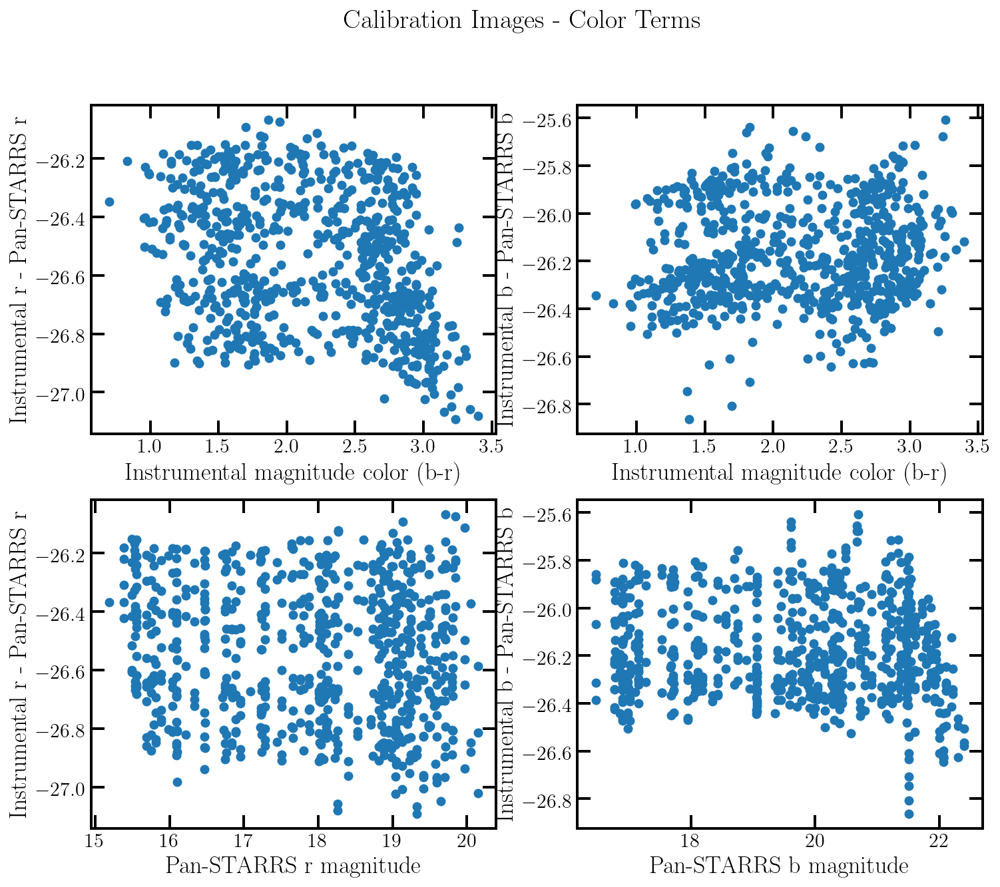

<Figure size 432x288 with 0 Axes>

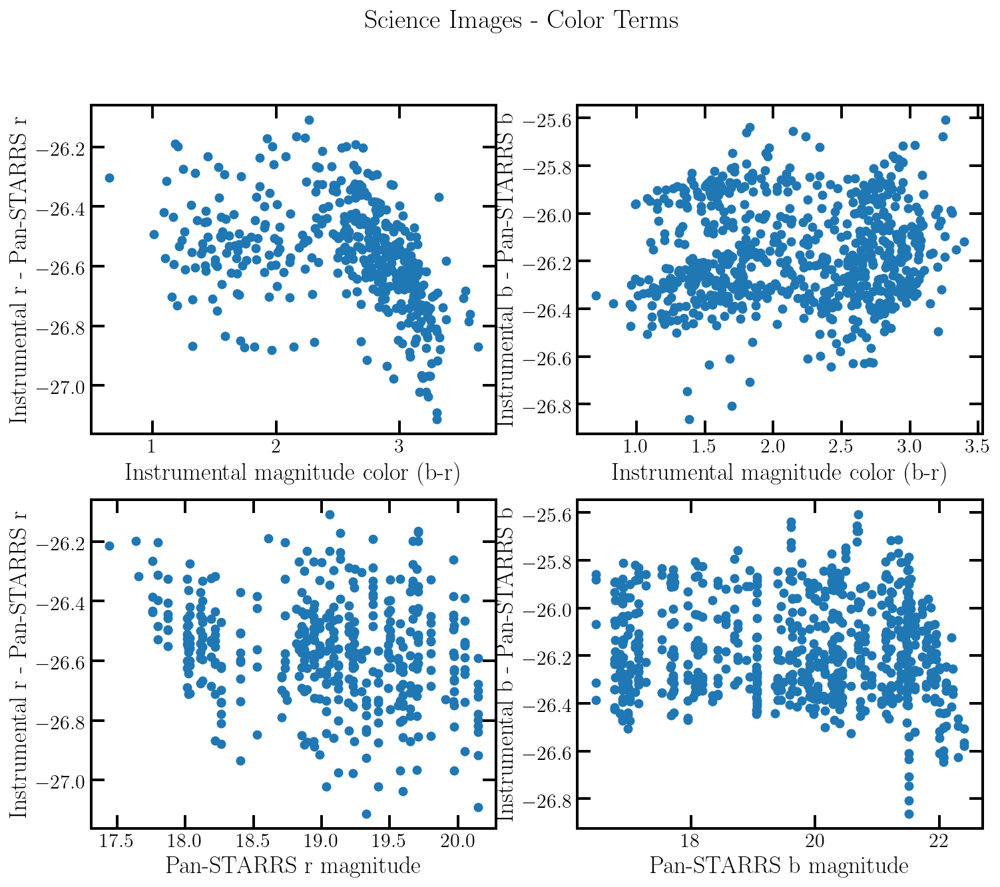

<Figure size 432x288 with 0 Axes>

In [5]:
# The catalogs should all the sorted now. 

ra_cut = np.array([137.7533912,137.7334531,137.400731,137.3802136])
dec_cut = np.array([73.4236248,73.3883209,73.2990843,73.275741])

for ftype in ['cali','sci']:

    ## Remove bad detections by hand
    if ftype == 'cali':
        coord_b = SkyCoord(cat_all_cali_b['ALPHA_J2000'],cat_all_cali_b['DELTA_J2000'],unit='deg')
        coord_cut = SkyCoord(ra_cut,dec_cut,unit='deg')

        idx, sep, _ = coord_b.match_to_catalog_sky(coord_cut)
        mask = sep.arcsec < 1.
        cat_all_cali_b = cat_all_cali_b[~mask]
        cat_all_cali_r = cat_all_cali_r[~mask]
        cat_all_cali_p = cat_all_cali_p[~mask]

    else:
        coord_b = SkyCoord(cat_all_sci_b['ALPHA_J2000'],cat_all_sci_b['DELTA_J2000'],unit='deg')
        coord_cut = SkyCoord(ra_cut,dec_cut,unit='deg')

        idx, sep, _ = coord_b.match_to_catalog_sky(coord_cut)
        mask = sep.arcsec < 1.
        cat_all_sci_b = cat_all_sci_b[~mask]
        cat_all_sci_r = cat_all_sci_r[~mask]
        cat_all_sci_p = cat_all_sci_p[~mask]
        

    ## Apply extinction correction
    '''
    # Find repeated observations of stars in Pan-STARRS
    arr, ind, counts = np.unique(cat_all_sci_p, return_index=True, return_counts=True)
    repeated_stars_p = cat_all_sci_p[ind[counts>1]]

    for star in repeated_stars_p:
        match = np.where(cat_all_sci_p == star)
        star_obs_r = cat_all_sci_r[match]
        star_obs_b = cat_all_sci_b[match]
        
        if len(star_obs_r) > 2:
            
        


        ext_coeff = 


    # Calculate extinction coefficient

    # Apply correction
    '''
    '''
    ## Calculate S/N for various apertures
    apers_diameter = utils.list_of_strings(flux_apers) # flux_apers comes from previous cell
    apertures = []
    
    if ftype == 'cali':
        cat_all_cali_r['FLUX_APER'].name = 'FLUX_APER_0'
        cat_all_cali_b['FLUX_APER'].name = 'FLUX_APER_0'
        for col in cat_all_cali_r.columns:
            if 'FLUX_APER' in col: apertures.append(col)

    
        for aper in apertures:
            aper_num = aper.split('_')[-1]
            npix = np.pi * (int(apers_diameter[int(aper_num)])/2)**2

            back_r = (cat_all_cali_r['Back_c00'] + cat_all_cali_r['Back_c10']*cat_all_cali_r['X_IMAGE'] + cat_all_cali_r['Back_c01']*cat_all_cali_r['Y_IMAGE'])*gain
            back_b = (cat_all_cali_b['Back_c00'] + cat_all_cali_b['Back_c10']*cat_all_cali_b['X_IMAGE'] + cat_all_cali_b['Back_c01']*cat_all_cali_b['Y_IMAGE'])*gain


            cat_all_cali_r[f'S/N_{aper_num}'] = (cat_all_cali_r[aper]*gain)/(np.sqrt((cat_all_cali_r[aper]*gain) + (back_r*npix) + ((cat_all_cali_r['readnoise']**2 * npix) + ((gain/2)**2 * npix))))
            cat_all_cali_b[f'S/N_{aper_num}'] = (cat_all_cali_b[aper]*gain)/(np.sqrt((cat_all_cali_b[aper]*gain) + (back_b*npix) + ((cat_all_cali_b['readnoise']**2 * npix) + ((gain/2)**2 * npix))))
    
    else:
        cat_all_sci_r['FLUX_APER'].name = 'FLUX_APER_0'
        cat_all_sci_b['FLUX_APER'].name = 'FLUX_APER_0'
        for col in cat_all_sci_r.columns:
            if 'FLUX_APER' in col: apertures.append(col)


        for aper in apertures:
            aper_num = aper.split('_')[-1]
            npix = np.pi * (int(apers_diameter[int(aper_num)])/2)**2
            
            back_r = (cat_all_sci_r['Back_c00'] + cat_all_sci_r['Back_c10']*cat_all_sci_r['X_IMAGE'] + cat_all_sci_r['Back_c01']*cat_all_sci_r['Y_IMAGE'])*gain
            back_b = (cat_all_sci_b['Back_c00'] + cat_all_sci_b['Back_c10']*cat_all_sci_b['X_IMAGE'] + cat_all_sci_b['Back_c01']*cat_all_sci_b['Y_IMAGE'])*gain


            cat_all_sci_r[f'S/N_{aper_num}'] = (cat_all_sci_r[aper]*gain)/(np.sqrt((cat_all_sci_r[aper]*gain) + (back_r*npix) + ((cat_all_sci_r['readnoise']**2 * npix) + ((gain/2)**2 * npix))))
            cat_all_sci_b[f'S/N_{aper_num}'] = (cat_all_sci_b[aper]*gain)/(np.sqrt((cat_all_sci_b[aper]*gain) + (back_b*npix) + ((cat_all_sci_b['readnoise']**2 * npix) + ((gain/2)**2 * npix))))
    
    '''
    ## Plot stuff! 
    
    # Color term plot
    if ftype == 'cali':
        fig, ax = plt.subplots(2, 2, figsize=(12,10))
        fig.suptitle('Calibration Images - Color Terms',fontsize=20)
        x = cat_all_cali_b['mag_inst'] - cat_all_cali_r['mag_inst']
        y = cat_all_cali_r['mag_inst'] - cat_all_cali_p['R-BESSEL_linear']
        ax[0][0].scatter(x,y)
        ax[0][0].set_xlabel('Instrumental magnitude color (b-r)')
        ax[0][0].set_ylabel('Instrumental r - Pan-STARRS r')
        
        x = cat_all_cali_b['mag_inst'] - cat_all_cali_r['mag_inst']
        y = cat_all_cali_b['mag_inst'] - cat_all_cali_p['B-BESSEL_linear']
        ax[0][1].scatter(x,y)
        ax[0][1].set_xlabel('Instrumental magnitude color (b-r)')
        ax[0][1].set_ylabel('Instrumental b - Pan-STARRS b')
        
        x = cat_all_cali_p['R-BESSEL_linear']
        y = cat_all_cali_r['mag_inst'] - cat_all_cali_p['R-BESSEL_linear']
        ax[1][0].scatter(x,y)
        ax[1][0].set_xlabel('Pan-STARRS r magnitude')
        ax[1][0].set_ylabel('Instrumental r - Pan-STARRS r')
        
        x = cat_all_cali_p['B-BESSEL_linear']
        y = cat_all_cali_b['mag_inst'] - cat_all_cali_p['B-BESSEL_linear']
        ax[1][1].scatter(x,y)
        ax[1][1].set_xlabel('Pan-STARRS b magnitude')
        ax[1][1].set_ylabel('Instrumental b - Pan-STARRS b')
        plt.savefig(os.path.join(in_dir,ftype,'diagnostic-plots',f'colorterms.png'),overwrite=True)
        plt.show()
        plt.clf()
        
    else:
        fig, ax = plt.subplots(2, 2, figsize=(12,10))
        fig.suptitle('Science Images - Color Terms',fontsize=20)
        x = cat_all_sci_b['mag_inst'] - cat_all_sci_r['mag_inst']
        y = cat_all_sci_r['mag_inst'] - cat_all_sci_p['R-BESSEL_linear']
        ax[0][0].scatter(x,y)
        ax[0][0].set_xlabel('Instrumental magnitude color (b-r)')
        ax[0][0].set_ylabel('Instrumental r - Pan-STARRS r')
        
        x = cat_all_cali_b['mag_inst'] - cat_all_cali_r['mag_inst']
        y = cat_all_cali_b['mag_inst'] - cat_all_cali_p['B-BESSEL_linear']
        ax[0][1].scatter(x,y)
        ax[0][1].set_xlabel('Instrumental magnitude color (b-r)')
        ax[0][1].set_ylabel('Instrumental b - Pan-STARRS b')
        
        x = cat_all_sci_p['R-BESSEL_linear']
        y = cat_all_sci_r['mag_inst'] - cat_all_sci_p['R-BESSEL_linear']
        ax[1][0].scatter(x,y)
        ax[1][0].set_xlabel('Pan-STARRS r magnitude')
        ax[1][0].set_ylabel('Instrumental r - Pan-STARRS r')
        
        x = cat_all_cali_p['B-BESSEL_linear']
        y = cat_all_cali_b['mag_inst'] - cat_all_cali_p['B-BESSEL_linear']
        ax[1][1].scatter(x,y)
        ax[1][1].set_xlabel('Pan-STARRS b magnitude')
        ax[1][1].set_ylabel('Instrumental b - Pan-STARRS b')
        plt.savefig(os.path.join(in_dir,ftype,'diagnostic-plots',f'colorterms.png'),overwrite=True)
        plt.show()
        plt.clf()

In [27]:
'''
num = [220,218,215,216,221,222,217,219,214,213,212,205,206,208,209,207,201,199,198,206,204,200,196,194,191,193,189,190,176,178,181,182,184,187,183,179,186,180,266,265,301,278]
num = np.asarray(num)

starcat_get_ra_dec = cat_all_sci_r[np.where(cat_all_sci_r['id'] == -1)]

for star_id in num:
    starcat_get_ra_dec = vstack([starcat_get_ra_dec,cat_all_sci_r[np.where(cat_all_sci_r['id'] == star_id)]])
starcat_get_ra_dec.keep_columns(['ALPHA_J2000', 'DELTA_J2000'])

starcat_get_ra_dec
ra=[]
dec=[]
for star in starcat_get_ra_dec:
    ra.append(star['ALPHA_J2000'])
    dec.append(star['DELTA_J2000'])
print(ra, dec)
''';

[265, 268, 269, 273, 274, 280, 281, 282, 283, 286, 288, 290, 298, 299, 300, 303, 304, 305]


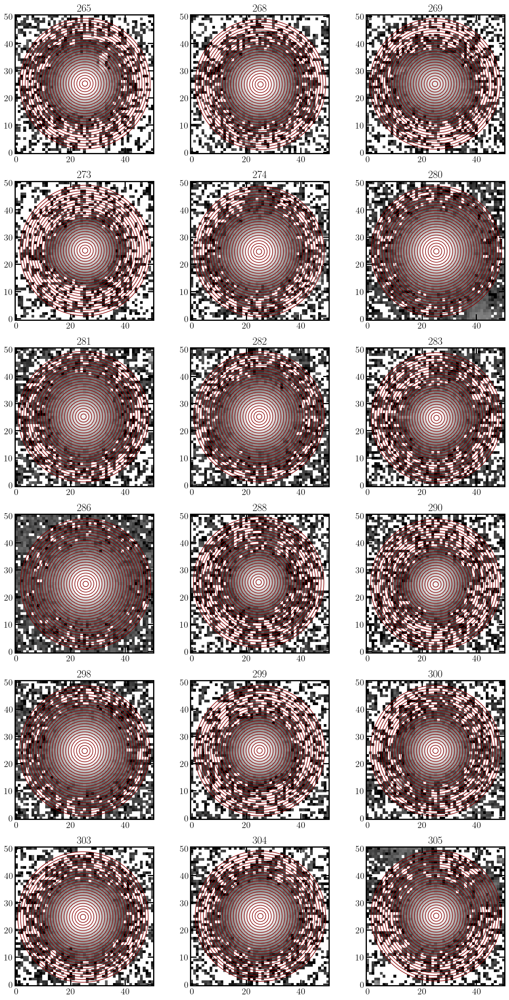

In [7]:
star_nums_r = [269,265,273,268,274,282,280,286,283,281,290,288,299,300,298,305,303,304]
star_nums_r.sort()
print(star_nums_r)
#star_nums_r = [268,278,304]
in_dir = '/Users/kirstencasey/m81_astrometry_out/sci/'
region_r = 'lbcr.20191220.071459-chip2_backsub_M81blob.proc_reg.reg'
image_r = 'lbcr.20191220.071459-chip2_backsub_M81blob.proc_reg.fits'
size = (51,51)
num_stars = len(star_nums_r)

file = open(in_dir+region_r, 'r') 
stars = file.readlines()
im_hdul = fits.open(in_dir+image_r)
aper_sums = np.zeros((num_stars,24))

fig, axs = plt.subplots(6, 3, figsize=(15,30))

row = 0
col = 0
star_count = 0
for star in stars:
    if 'global' in star: continue
    num = star.split('}')[0].split('text={')[-1]
    if 'red' in num: continue
    num = int(num)
    if num in star_nums_r:
        position = [float(star.split(' ')[1])-1,float(star.split(' ')[2])-1]
        cutout = Cutout2D(im_hdul[0].data, position, size)
        x_corrected = position[0]-cutout.origin_original[0]
        y_corrected = position[1]-cutout.origin_original[1]
        position_corrected = (x_corrected,y_corrected)
        
        apertures = [CircularAperture(position_corrected, r=r) for r in radii]
        
        phot_table = aperture_photometry(cutout.data, apertures)
        for phot_col in phot_table.colnames:
             phot_table[phot_col].info.format = '%.8g'  # for consistent table output
        aper_sums[star_count] = np.array([phot_table[0][f'aperture_sum_{i}'] for i in np.arange(24)])
        
        norm=colors.LogNorm(vmin=10, vmax=12000)        
        axs[row, col].imshow(cutout.data, origin='lower', norm=norm, cmap='gray')
        axs[row, col].set_title(num)
        for aper in apertures:
            aper.plot(axs[row, col],color='darkred')

        col +=1
        if col==3:
            row+=1
            col=0

        star_count+=1
        
plt.savefig(os.path.join(in_dir,f'diagnostic-plots/aperture_plots_r.png'),overwrite=True)

file.close()
im_hdul.close()

aper_sums_r = aper_sums

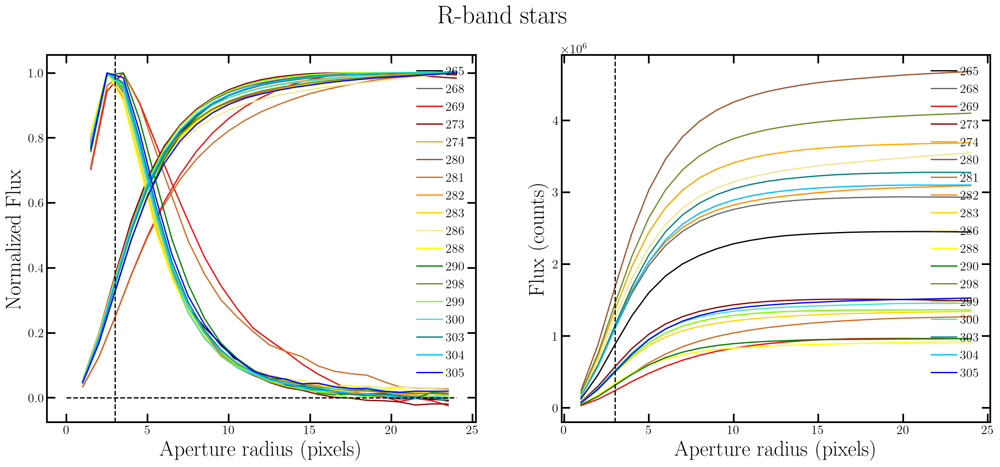

In [75]:
fig, axs = plt.subplots(1,2,figsize=(20,8))
fig.suptitle('R-band stars', fontsize=30)
axs[0].set_xlabel('Aperture radius (pixels)',fontsize=25)
axs[0].set_ylabel('Normalized Flux',fontsize=25)
axs[1].set_xlabel('Aperture radius (pixels)',fontsize=25)
axs[1].set_ylabel('Flux (counts)',fontsize=25)
colors = ['black','dimgrey','red','darkred','orange','sienna','chocolate','darkorange','gold','khaki','yellow','green','olivedrab','lawngreen','turquoise','teal','deepskyblue','blue']
ind = 0
for aper_sum, star_num in zip(aper_sums_r,star_nums_r):
    
    der = np.diff(aper_sum) / np.diff(radii)
    
    # Find the aperture radius where the derivative crosses zero (or meets other threshold)
    # Estimate the flux at that radius
    if len(np.where(np.diff(np.sign(der)))[0]) == 0:
        flux_level = max(aper_sum)   
    else:
        zero_crossing = np.where(np.diff(np.sign(der)))[0][0]
        flux_level = aper_sum[zero_crossing+1]


    axs[0].plot(radii,aper_sum*gain/(flux_level*gain),label=star_num,color=colors[ind])
    axs[1].plot(radii,aper_sum*gain,label=star_num,color=colors[ind])    
    rad = (radii[:-1] +radii[1:]) / 2
    axs[0].plot(rad,der/max(der),color=colors[ind])
    ind+=1
axs[0].axvline(x=chosen_aper,c='black',linestyle='dashed')
axs[1].axvline(x=chosen_aper,c='black',linestyle='dashed')
axs[0].plot(np.arange(25),np.zeros(25),color='black',linestyle='dashed')
axs[0].legend(fontsize=15,loc='upper right')
axs[1].legend(fontsize=15,loc='upper right')
plt.savefig(os.path.join(in_dir,f'diagnostic-plots/curveofgrowth_r.png'),overwrite=True)

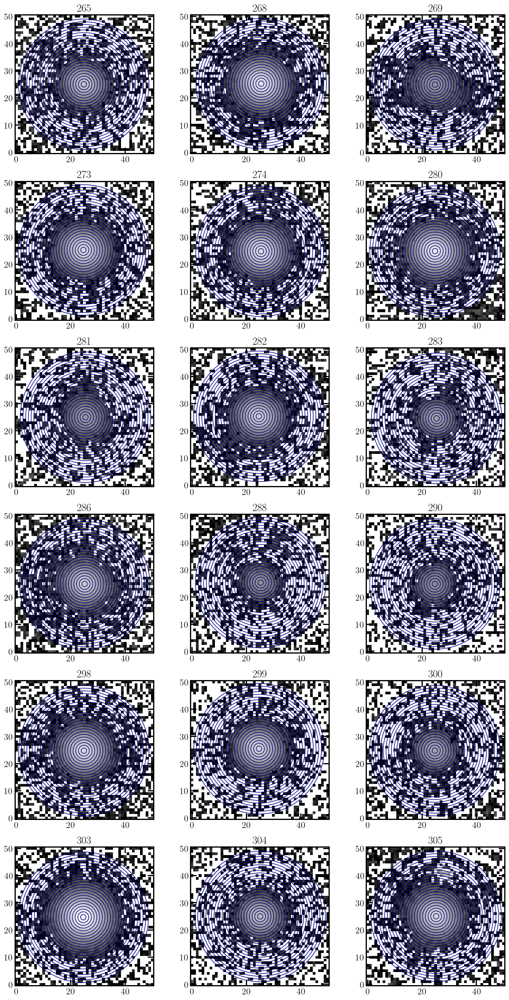

In [9]:
star_nums_b = [269,265,273,268,274,282,280,286,283,281,290,288,299,300,298,305,303,304]
star_nums_b.sort()
#star_nums = [268,278,304]
in_dir = '/Users/kirstencasey/m81_astrometry_out/sci/'
region_b = 'lbcb.20191220.071505-chip2_backsub_M81blob.proc_reg.reg'
image_b = 'lbcb.20191220.071505-chip2_backsub_M81blob.proc_reg.fits'
size = (51,51)
num_stars = len(star_nums_b)

file = open(in_dir+region_b, 'r') 
stars = file.readlines()
im_hdul = fits.open(in_dir+image_b)
aper_sums = np.zeros((num_stars,24))

fig, axs = plt.subplots(6, 3, figsize=(15,30))

row = 0
col = 0
star_count = 0
for star in stars:
    if 'global' in star: continue
    num = star.split('}')[0].split('text={')[-1]
    if 'red' in num: continue
    num = int(num)
    if num in star_nums_b:
        position = [float(star.split(' ')[1])-1,float(star.split(' ')[2])-1]
        cutout = Cutout2D(im_hdul[0].data, position, size)
        x_corrected = position[0]-cutout.origin_original[0]
        y_corrected = position[1]-cutout.origin_original[1]
        position_corrected = (x_corrected,y_corrected)
        
        apertures = [CircularAperture(position_corrected, r=r) for r in radii]
        
        phot_table = aperture_photometry(cutout.data, apertures)
        for phot_col in phot_table.colnames:
             phot_table[phot_col].info.format = '%.8g'  # for consistent table output
        aper_sums[star_count] = np.array([phot_table[0][f'aperture_sum_{i}'] for i in np.arange(24)])
        
        norm=colors.LogNorm(vmin=10, vmax=12000)        
        axs[row, col].imshow(cutout.data, origin='lower', norm=norm, cmap='gray')
        axs[row, col].set_title(num)
        for aper in apertures:
            aper.plot(axs[row, col],color='darkblue')

        col +=1
        if col==3:
            row+=1
            col=0

        star_count+=1
        
plt.savefig(os.path.join(in_dir,f'diagnostic-plots/aperture_plots_b.png'),overwrite=True)

file.close()
im_hdul.close()

aper_sums_b = aper_sums

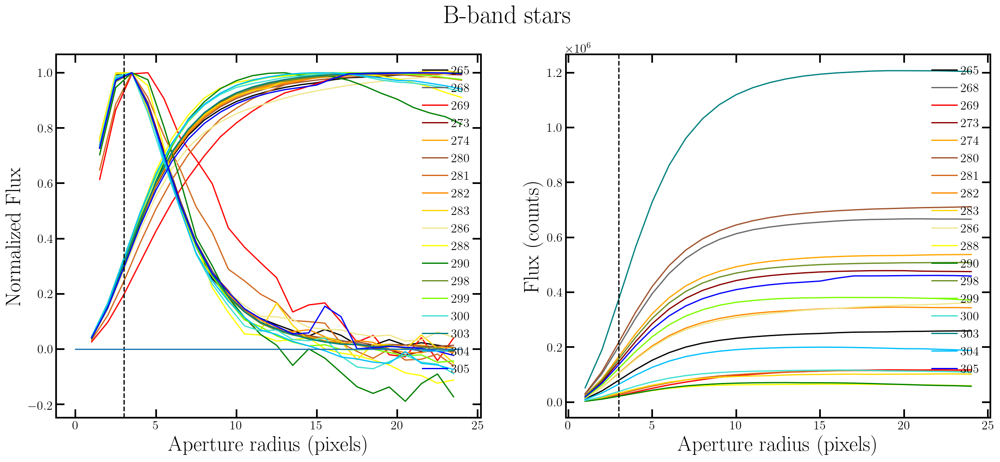

In [77]:
fig, axs = plt.subplots(1,2,figsize=(20,8))
fig.suptitle('B-band stars', fontsize=30)
axs[0].set_xlabel('Aperture radius (pixels)',fontsize=25)
axs[0].set_ylabel('Normalized Flux',fontsize=25)
axs[1].set_xlabel('Aperture radius (pixels)',fontsize=25)
axs[1].set_ylabel('Flux (counts)',fontsize=25)
ind=0
for aper_sum, star_num in zip(aper_sums_b,star_nums_b):
    
    der = np.diff(aper_sum) / np.diff(radii)
    
    # Find the aperture radius where the derivative crosses zero (or meets other threshold)
    # Estimate the flux at that radius
    if len(np.where(np.diff(np.sign(der)))[0]) == 0:
        flux_level = max(aper_sum)   
    else:
        zero_crossing = np.where(np.diff(np.sign(der)))[0][0]
        flux_level = aper_sum[zero_crossing+1]

    axs[0].plot(radii,aper_sum*gain/(flux_level*gain),color=colors[ind],label=star_num)
    axs[1].plot(radii,aper_sum*gain,label=star_num,color=colors[ind])    
    rad = (radii[:-1] +radii[1:]) / 2
    axs[0].plot(rad,der/max(der),color=colors[ind])
    ind+=1
axs[0].axvline(x=chosen_aper,c='black',linestyle='dashed')
axs[1].axvline(x=chosen_aper,c='black',linestyle='dashed')
axs[0].plot(np.arange(25),np.zeros(25))
axs[0].legend(fontsize=15,loc='upper right')
axs[1].legend(fontsize=15,loc='upper right')
plt.savefig(os.path.join(in_dir,f'diagnostic-plots/curveofgrowth_b.png'),overwrite=True)

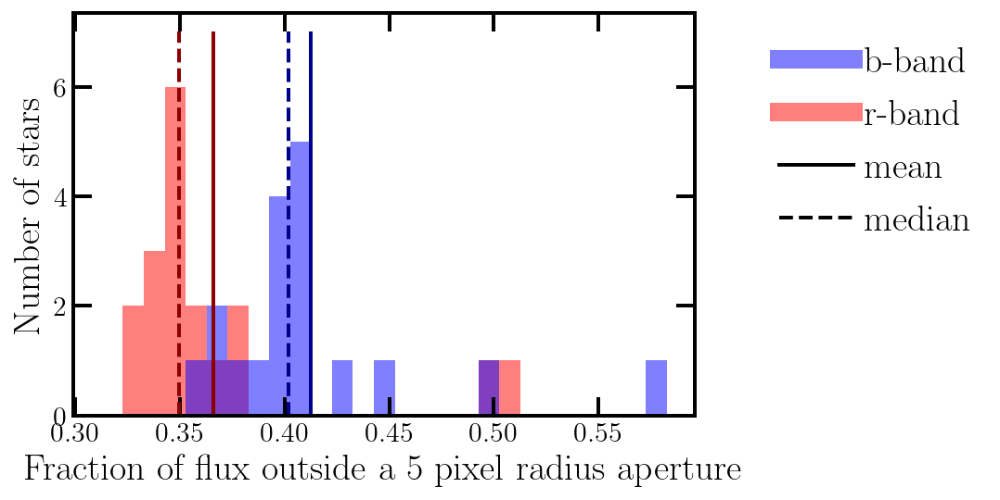

In [68]:
# Plot the fraction of flux in aperture of size 3 pixels for each star given a certain threshold
# Plot this in terms of magnitudes 

flux_fracs_r = []
flux_fracs_b = []
flux_levels_r = []
flux_levels_b = []


# Loop through stars (aper_sum)
for aper_sum, star_num in zip(aper_sums_r,star_nums_r):
    
    # Calculate the derivative of the flux
    flux_der = np.diff(aper_sum) / np.diff(radii)
    
    # Find the aperture radius where the derivative crosses zero (or meets other threshold)
    # Estimate the flux at that radius
    if len(np.where(np.diff(np.sign(flux_der)))[0]) == 0:
        flux_level = max(aper_sum)
        
    else:
        zero_crossing = np.where(np.diff(np.sign(flux_der)))[0][0]
        flux_level = aper_sum[zero_crossing+1]
    
    # Find the fraction of the flux missing at an aperture radius of 3 pixels
    flux_fraction = 1 - (aper_sum[np.where(radii==chosen_aper)] / flux_level)
    flux_fracs_r.append(flux_fraction)
    flux_levels_r.append(flux_level)

flux_mean_r = np.mean(flux_fracs_r)
flux_median_r = np.median(flux_fracs_r)
    
# Loop through stars (aper_sum)
for aper_sum, star_num in zip(aper_sums_b,star_nums_b):
    
    # Calculate the derivative of the flux
    flux_der = np.diff(aper_sum) / np.diff(radii)
    
    # Find the aperture radius where the derivative crosses zero (or meets other threshold)
    # Estimate the flux at that radius
    if len(np.where(np.diff(np.sign(flux_der)))[0]) == 0:
        flux_level = max(aper_sum)
        
    else:
        zero_crossing = np.where(np.diff(np.sign(flux_der)))[0][0]
        flux_level = aper_sum[zero_crossing+1]
    
    # Find the fraction of the flux missing at an aperture radius of 3 pixels
    flux_fraction = 1 - (aper_sum[np.where(radii==chosen_aper)] / flux_level)
    flux_fracs_b.append(flux_fraction)
    flux_levels_b.append(flux_level)

flux_mean_b = np.mean(flux_fracs_b)
flux_median_b = np.median(flux_fracs_b) 

# Find best bins
min_bin = min(flux_fracs_r) - 0.01
max_bin = max(flux_fracs_b) + 0.01

#plt.hist(np.asarray(flux_fracs))
plt.xlabel(f'Fraction of flux outside a {chosen_aper} pixel radius aperture',fontsize=20)
plt.ylabel('Number of stars',fontsize=20)
plt.hist(np.asarray(flux_fracs_r),color='red',bins=np.arange(min_bin,max_bin,0.01),alpha=0.5,label='r-band');
plt.hist(np.asarray(flux_fracs_b),color='blue',bins=np.arange(min_bin,max_bin,0.01),alpha=0.5,label='b-band');
plt.vlines(flux_mean_r,0,7,color='darkred',lw=2)
plt.vlines(flux_mean_b,0,7,color='darkblue',lw=2)
plt.vlines(flux_median_r,0,7,color='darkred',lw=2,linestyle='dashed')
plt.vlines(flux_median_b,0,7,color='darkblue',lw=2,linestyle='dashed')
custom_lines = [Line2D([0], [0], color='blue', lw=10, alpha=0.5),
                Line2D([0], [0], color='red', lw=10, alpha=0.5),
                Line2D([0], [0], color='black', lw=2),
                Line2D([0], [0], color='black', lw=2, linestyle='dashed')]

plt.legend(custom_lines, ['b-band','r-band','mean', 'median'],fontsize=20,bbox_to_anchor=(1.5, 1))
plt.text(.45,5,f'b-band median: {round(flux_median_b,3)}\nr-band median: {round(flux_median_r,3)}',fontsize=18)
plt.savefig(os.path.join(in_dir,f'diagnostic-plots/fluxfraction_{chosen_aper}pix.png'),overwrite=True)

In [91]:
## Compare mags to Pan-STARRS

# Find stars in catalogs cat_all_sci_p, cat_all_sci_b, cat_all_sci_r
stars_sci_b = cat_all_sci_b[star_nums_b]
stars_sci_r = cat_all_sci_r[star_nums_r]
stars_sci_pr = cat_all_sci_p[star_nums_r]
stars_sci_pb = cat_all_sci_p[star_nums_b]



aper_ind = np.where(radii==chosen_aper)[0][0] # CHOSEN_APER in previous cell

stars_sci_b = compare_mags(aper_sums_b,aper_ind,stars_sci_b,stars_sci_pb,flux_median_b,flux_levels_b,'b')
stars_sci_r = compare_mags(aper_sums_r,aper_ind,stars_sci_r,stars_sci_pr,flux_median_r,flux_levels_r,'r')




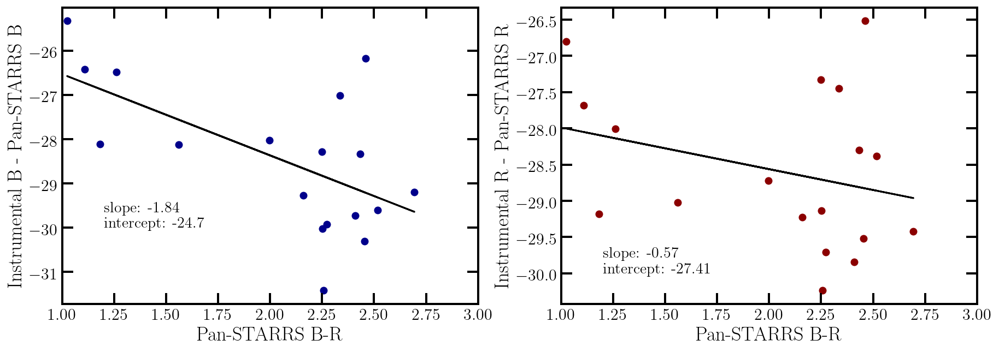

<Figure size 432x288 with 0 Axes>

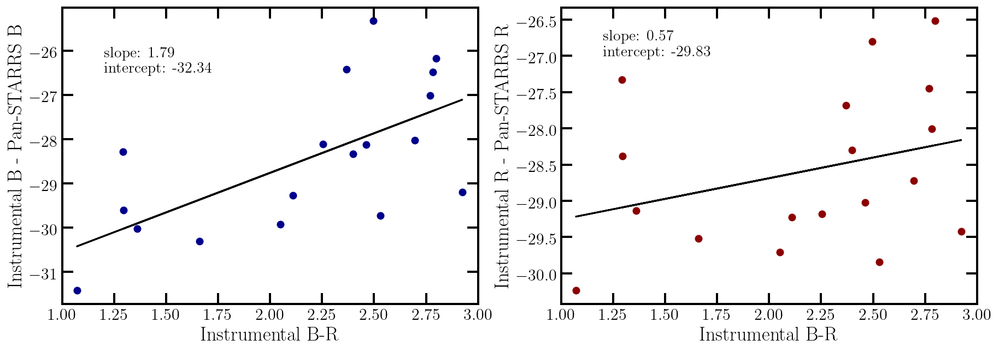

<Figure size 432x288 with 0 Axes>

In [50]:
count = 0
fig,ax = plt.subplots(1,2,figsize=(15,5))
fit = fitting.LinearLSQFitter()
line_init = models.Linear1D()

for band, cat, pan in zip(['B','R'], [stars_sci_b,stars_sci_r],[stars_sci_pb,stars_sci_pr]):
    if band == 'B': color = 'darkblue'
    else: color = 'darkred'
    x = pan['B-BESSEL_linear'] - pan['R-BESSEL_linear']
    y = cat['mag_aper_corrected'] - pan[f'{band}-BESSEL_linear']
    ax[count].scatter(x,y,color=color)
    ax[count].set_xlim(1,3)
    ax[count].set_xlabel(f'Pan-STARRS B-R')
    ax[count].set_ylabel(f'Instrumental {band} - Pan-STARRS {band}')
    fitted_line = fit(line_init, x, y)
    ax[count].plot(x, fitted_line(x), 'k-', label='Fitted Model')
    ax[count].text(1.2,-30,f'slope: {round(fitted_line.slope.value, 2)}\nintercept: {round(fitted_line.intercept.value, 2)}',fontsize=14)
    if band == 'B': 
        fitted_line_pan_b = fitted_line
    else: 
        fitted_line_pan_r = fitted_line
    count+=1

plt.savefig(os.path.join(in_dir,f'diagnostic-plots/color_terms_after_aper_corrections_pan.png'))
plt.show()
plt.clf()

stars_sci_p = stars_sci_pb
fig,ax = plt.subplots(1,2,figsize=(15,5))

x = stars_sci_b['mag_aper_corrected'] - stars_sci_r['mag_aper_corrected']
y_r = stars_sci_r['mag_aper_corrected'] - stars_sci_p['R-BESSEL_linear']
y_b = stars_sci_b['mag_aper_corrected'] - stars_sci_p['B-BESSEL_linear']
ax[0].scatter(x,y_b,color='darkblue')
ax[0].set_xlabel(f'Instrumental B-R')
ax[0].set_ylabel(f'Instrumental B - Pan-STARRS B')
ax[0].set_xlim(1,3)
fitted_line = fit(line_init, x, y_b)
ax[0].plot(x, fitted_line(x), 'k-', label='Fitted Model')
ax[0].text(1.2,-26.5,f'slope: {round(fitted_line.slope.value, 2)}\nintercept: {round(fitted_line.intercept.value, 2)}',fontsize=14)
fitted_line_inst_b = fitted_line

ax[1].scatter(x,y_r,color='darkred')
ax[1].set_xlabel(f'Instrumental B-R')
ax[1].set_ylabel(f'Instrumental R - Pan-STARRS R')
ax[1].set_xlim(1,3)

fitted_line = fit(line_init, x, y_r)
ax[1].plot(x, fitted_line(x), 'k-', label='Fitted Model')
ax[1].text(1.2,-27,f'slope: {round(fitted_line.slope.value, 2)}\nintercept: {round(fitted_line.intercept.value, 2)}',fontsize=14)
fitted_line_inst_r = fitted_line

plt.savefig(os.path.join(in_dir,f'diagnostic-plots/color_terms_after_aper_corrections_inst.png'))
plt.show()
plt.clf()

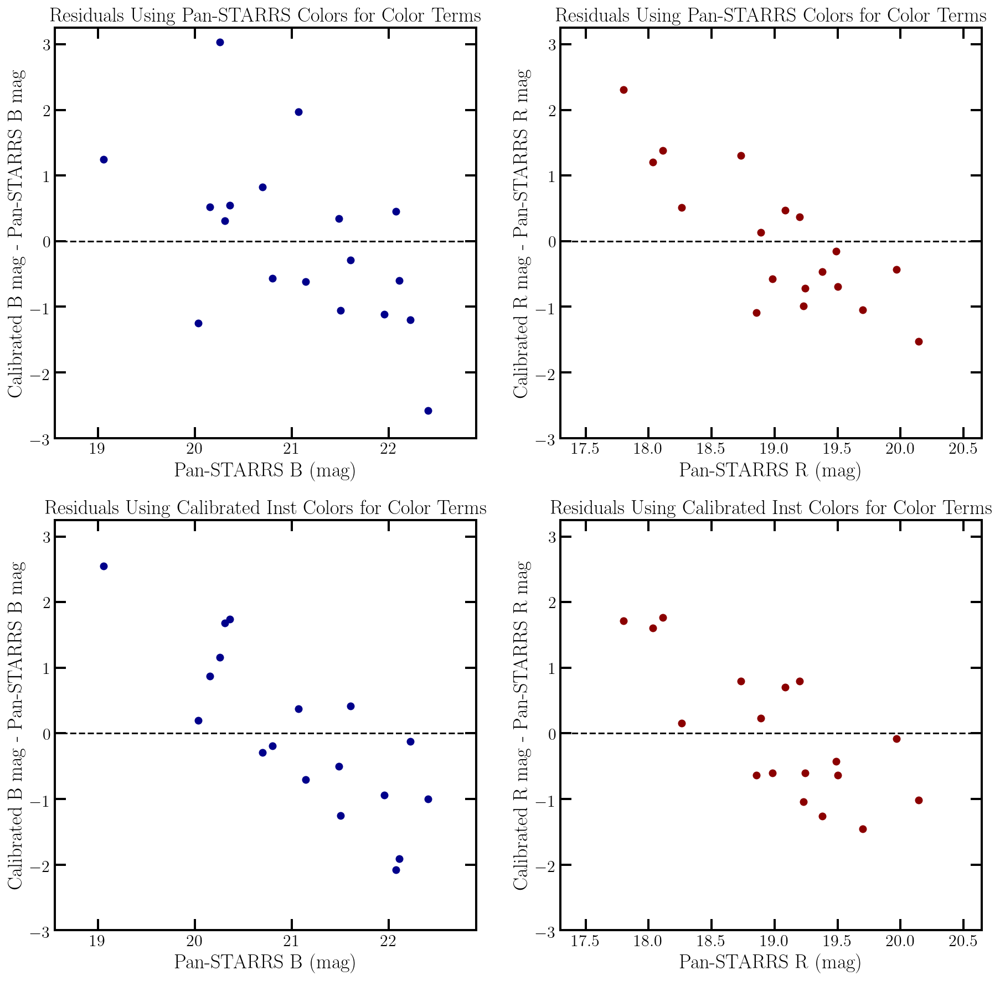

In [67]:
# Calculate color corrected mags for aperture corrected stars
mag_color_corrected_pan_r = []
mag_color_corrected_pan_b = []
mag_color_corrected_inst_r = []
mag_color_corrected_inst_b = []

for star_r, star_b, star_p in zip(stars_sci_r,stars_sci_b,stars_sci_p):
    x_p = star_p['B-BESSEL_linear'] - star_p['R-BESSEL_linear']
    x_inst = star_b['mag_aper_corrected'] - star_r['mag_aper_corrected']
    mag_color_corrected_pan_r.append( star_r['mag_aper_corrected'] - fitted_line_pan_r(x_p) )
    mag_color_corrected_pan_b.append( star_b['mag_aper_corrected'] - fitted_line_pan_b(x_p) )
    mag_color_corrected_inst_r.append( star_r['mag_aper_corrected'] - fitted_line_inst_r(x_inst) )
    mag_color_corrected_inst_b.append( star_b['mag_aper_corrected'] - fitted_line_inst_b(x_inst) )
    
stars_sci_r['mag_aper_color_corrected_pan'] = mag_color_corrected_pan_r
stars_sci_r['mag_aper_color_corrected_inst'] = mag_color_corrected_inst_r
stars_sci_b['mag_aper_color_corrected_pan'] = mag_color_corrected_pan_b
stars_sci_b['mag_aper_color_corrected_inst'] = mag_color_corrected_inst_b


fig,ax = plt.subplots(2,2,figsize=(15,15))
x = stars_sci_p['B-BESSEL_linear']
y = stars_sci_b['mag_aper_color_corrected_pan'] - stars_sci_p['B-BESSEL_linear']
ax[0][0].scatter(x,y,color='darkblue')
ax[0][0].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[0][0].set_xlim(min(x)-0.5,max(x)+0.5)
ax[0][0].set_ylim(-3,3.25)
ax[0][0].set_xlabel('Pan-STARRS B (mag)')
ax[0][0].set_ylabel('Calibrated B mag - Pan-STARRS B mag')
ax[0][0].title.set_text('Residuals Using Pan-STARRS Colors for Color Terms')

x = stars_sci_p['R-BESSEL_linear']
y = stars_sci_r['mag_aper_color_corrected_pan'] - stars_sci_p['R-BESSEL_linear']
ax[0][1].scatter(x,y,color='darkred')
ax[0][1].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[0][1].set_xlim(min(x)-0.5,max(x)+0.5)
ax[0][1].set_ylim(-3,3.25)
ax[0][1].set_xlabel('Pan-STARRS R (mag)')
ax[0][1].set_ylabel('Calibrated R mag - Pan-STARRS R mag')
ax[0][1].title.set_text('Residuals Using Pan-STARRS Colors for Color Terms')

x = stars_sci_p['B-BESSEL_linear']
y = stars_sci_b['mag_aper_color_corrected_inst'] - stars_sci_p['B-BESSEL_linear']
ax[1][0].scatter(x,y,color='darkblue')
ax[1][0].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[1][0].set_xlim(min(x)-0.5,max(x)+0.5)
ax[1][0].set_ylim(-3,3.25)
ax[1][0].set_xlabel('Pan-STARRS B (mag)')
ax[1][0].set_ylabel('Calibrated B mag - Pan-STARRS B mag')
ax[1][0].title.set_text('Residuals Using Calibrated Inst Colors for Color Terms')

x = stars_sci_p['R-BESSEL_linear']
y = stars_sci_r['mag_aper_color_corrected_inst'] - stars_sci_p['R-BESSEL_linear']
ax[1][1].scatter(x,y,color='darkred')
ax[1][1].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[1][1].set_xlim(min(x)-0.5,max(x)+0.5)
ax[1][1].set_ylim(-3,3.25)
ax[1][1].set_xlabel('Pan-STARRS R (mag)')
ax[1][1].set_ylabel('Calibrated R mag - Pan-STARRS R mag')
ax[1][1].title.set_text('Residuals Using Calibrated Inst Colors for Color Terms')

plt.savefig(os.path.join(in_dir,f'diagnostic-plots/residuals_after_aper_color_corrections.png'))

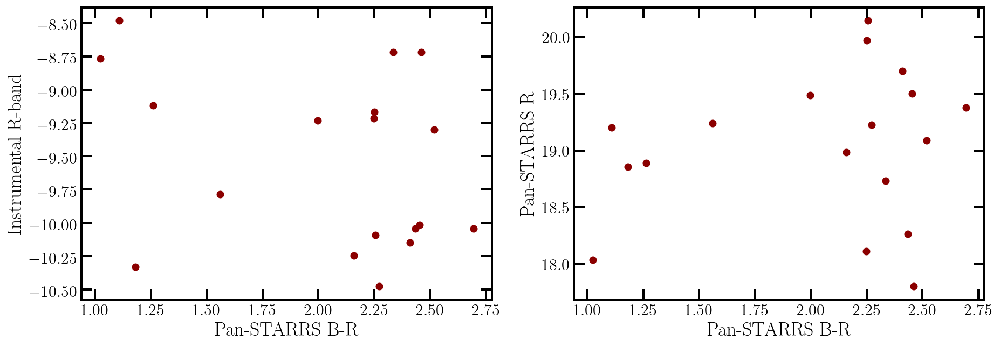

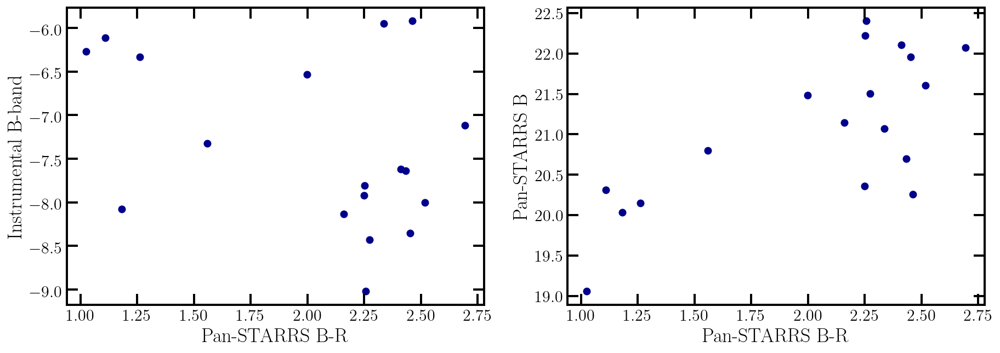

In [14]:

fig,ax = plt.subplots(1,2,figsize=(15,5))
x = stars_sci_pr['B-BESSEL_linear'] - stars_sci_pr['R-BESSEL_linear']
y = stars_sci_r['mag_aper_corrected']
ax[0].scatter(x,y,color='darkred')
ax[0].set_xlabel(f'Pan-STARRS B-R')
ax[0].set_ylabel(f'Instrumental R-band')

x = stars_sci_pr['B-BESSEL_linear'] - stars_sci_pr['R-BESSEL_linear']
y = stars_sci_pr['R-BESSEL_linear']
ax[1].scatter(x,y,color='darkred')
ax[1].set_xlabel(f'Pan-STARRS B-R')
ax[1].set_ylabel(f'Pan-STARRS R')

plt.show()


fig,ax = plt.subplots(1,2,figsize=(15,5))
x = stars_sci_pb['B-BESSEL_linear'] - stars_sci_pb['R-BESSEL_linear']
y = stars_sci_b['mag_aper_corrected']
ax[0].scatter(x,y,color='darkblue')
ax[0].set_xlabel(f'Pan-STARRS B-R')
ax[0].set_ylabel(f'Instrumental B-band')

x = stars_sci_pb['B-BESSEL_linear'] - stars_sci_pb['R-BESSEL_linear']
y = stars_sci_pb['B-BESSEL_linear']
ax[1].scatter(x,y,color='darkblue')
ax[1].set_xlabel(f'Pan-STARRS B-R')
ax[1].set_ylabel(f'Pan-STARRS B')


plt.show()

# START HERE

In [91]:
# This is going to be a repeat of the calculations above, but for all exposures. 

ra = [137.7262942,137.714596,137.6643899,137.6420974,137.4992185,137.4461423,137.4388939,137.3525024,137.4056174,137.4392844,137.4461888,137.3702873,137.5423279,137.6534788,137.6692625,137.7191218,137.7223919,137.6665591,137.6701466,137.5423279,137.4845279,137.476379,137.4611948,137.4143842,137.7260515,137.6640379,137.6196416,137.4230134,137.4305749,137.4205024,137.4735126,137.4221412,137.5283053,137.5118903,137.596344,137.5879194,137.7236192,137.6880205,137.7455671,137.7364386,137.7763348,137.7581471]
dec = [73.5453196, 73.5427786, 73.5376909, 73.5403891, 73.5468038, 73.5474984, 73.5412156, 73.5457036, 73.5280876, 73.5145623, 73.5128473, 73.4648551, 73.4672959, 73.4902576, 73.4939718, 73.4835499, 73.4498617, 73.4426896, 73.4379245, 73.4672959, 73.4556656, 73.443906, 73.4293992, 73.4010776, 73.3654481, 73.3700384, 73.3548876, 73.3587998, 73.2855557, 73.2908874, 73.3000978, 73.3058502, 73.3124748, 73.3297097, 73.311034, 73.2930514, 73.3228701, 73.2976376, 73.2810875, 73.2801706, 73.4821576, 73.3256783]
stars_for_aper_corrections = Table()
stars_for_aper_corrections['ra'] = ra
stars_for_aper_corrections['dec'] = dec

coord_r = SkyCoord(cat_all_sci_r['ALPHA_J2000'],cat_all_sci_r['DELTA_J2000'],unit='deg')
coord_aper = SkyCoord(ra,dec,unit='deg')

idx, sep, _ = coord_r.match_to_catalog_sky(coord_aper)
mask = sep.arcsec < 1.
cat_magcal_sci_b = cat_all_sci_b[mask]
cat_magcal_sci_r = cat_all_sci_r[mask]
cat_magcal_sci_p = cat_all_sci_p[mask]

print(len(cat_magcal_sci_b),len(cat_magcal_sci_r),len(cat_magcal_sci_p)) # These should all be the same

334 334 334


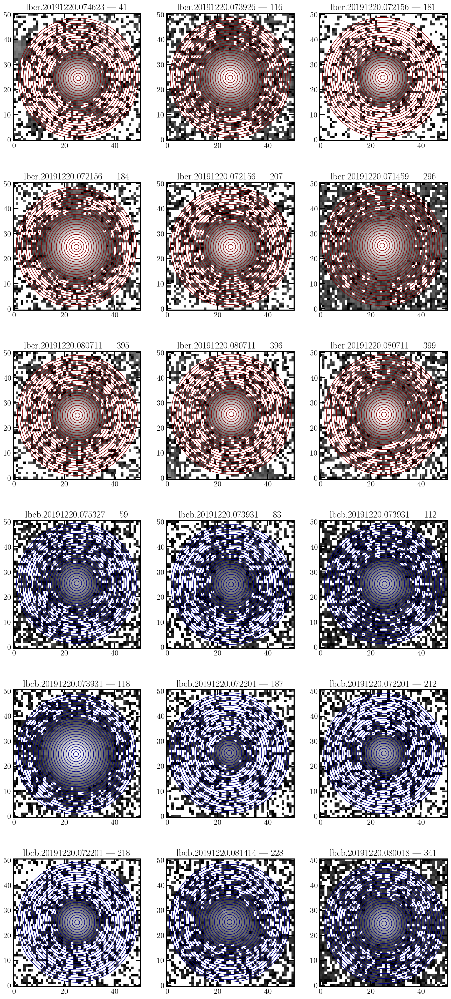

In [92]:
# Get aperture sums for all radii, in both r- and b-band
in_dir = '/Users/kirstencasey/m81_astrometry_out/sci/'
out_dir = in_dir + 'diagnostic-plots/'
size = (51,51)
fig, axs = plt.subplots(6, 3, figsize=(15,35))
saturation_limit = 65536
mask_r = []
mask_b = []

row = 0
col = 0
for stars, band in zip([cat_magcal_sci_r, cat_magcal_sci_b],['r','b']):
    aper_sums = np.zeros((len(cat_magcal_sci_p),len(radii)))
    star_count = 0
    star_nums = random.sample(range(len(cat_magcal_sci_p)), k=9)
    if band == 'r': color = 'darkred'
    else: color = 'darkblue'
    for star in stars:
        file = star['filename']
        file_stub = file.split('-chip')[0]
        star_id = star['id']
        im_hdul = fits.open(os.path.join(in_dir,file))
        position = (star['X_IMAGE']-1,star['Y_IMAGE']-1)

        cutout = Cutout2D(im_hdul[0].data, position, size)
        
        if np.sum(cutout.data >= saturation_limit) != 0:
            if band == 'r': mask_r.append(False)
            else: mask_b.append(False)
        else:
            if band == 'r': mask_r.append(True)
            else: mask_b.append(True)
            
        x_corrected = position[0]-cutout.origin_original[0]
        y_corrected = position[1]-cutout.origin_original[1]
        position_corrected = (x_corrected,y_corrected)
        
        apertures = [CircularAperture(position_corrected, r=r) for r in radii]
        
        phot_table = aperture_photometry(cutout.data, apertures)
        for phot_col in phot_table.colnames:
             phot_table[phot_col].info.format = '%.8g'  # for consistent table output
        aper_sums[star_count] = np.array([phot_table[0][f'aperture_sum_{i}'] for i in np.arange(len(radii))])
        
        if star_count in star_nums:
            norm=colors.LogNorm(vmin=10, vmax=12000)        
            axs[row, col].imshow(cutout.data, origin='lower', norm=norm, cmap='gray')
            axs[row, col].set_title(f'{file_stub} | {star_id}')
            for aper in apertures:
                aper.plot(axs[row, col],color=color)

            col +=1
            if col==3:
                row+=1
                col=0

        star_count+=1
        im_hdul.close()
    if band == 'r':
        aper_sums_all_r = aper_sums
    else: aper_sums_all_b = aper_sums
        
plt.savefig(os.path.join(out_dir,f'aperture_plots_all_exposures.png'),overwrite=True)



#print(mask_r,mask_b)

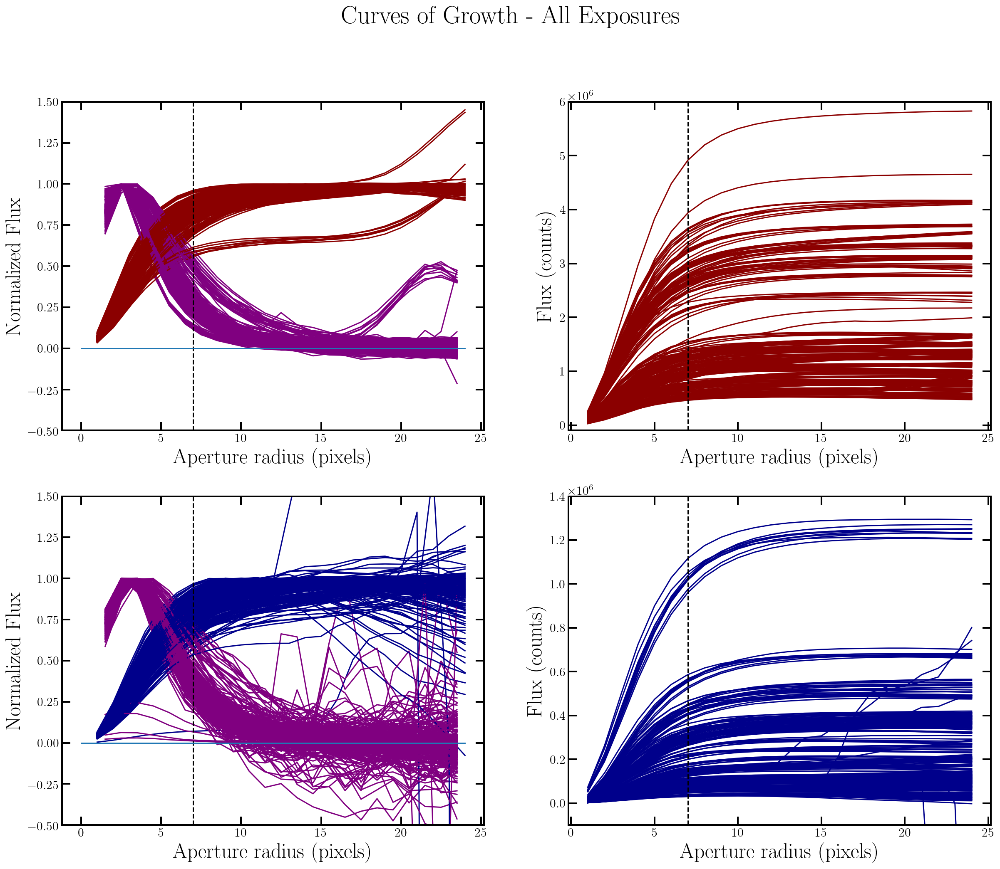

In [100]:
fig, axs = plt.subplots(2,2,figsize=(20,16))
fig.suptitle('Curves of Growth - All Exposures', fontsize=30)

for star_apers,band,star_cat in zip([aper_sums_all_r, aper_sums_all_b],['r','b'],[cat_magcal_sci_r, cat_magcal_sci_b]):
   
    if band == 'r': 
        row = 0
        color = 'darkred'
    else: 
        row = 1
        color = 'darkblue'
    axs[row][0].set_xlabel('Aperture radius (pixels)',fontsize=25)
    axs[row][0].set_ylabel('Normalized Flux',fontsize=25)
    axs[row][1].set_xlabel('Aperture radius (pixels)',fontsize=25)
    axs[row][1].set_ylabel('Flux (counts)',fontsize=25)
    #ind=0
    for aper_sum, star_num, exp_name in zip(star_apers,star_cat['id'],star_cat['filename']):

        der = np.diff(aper_sum) / np.diff(radii)

        # Find the aperture radius where the derivative crosses zero (or meets other threshold)
        # Estimate the flux at that radius
        if len(np.where(np.diff(np.sign(der)))[0]) == 0:
            flux_level = max(aper_sum)   
        else:
            zero_crossing = np.where(np.diff(np.sign(der)))[0][0]
            flux_level = aper_sum[zero_crossing+1]
        
        axs[row][0].plot(radii,aper_sum*gain/(flux_level*gain),color=color)#s[ind])
        axs[row][1].plot(radii,aper_sum*gain,label=star_num,color=color)#s[ind])
        rad = (radii[:-1] +radii[1:]) / 2
        axs[row][0].plot(rad,der/max(der),color=color)#s[ind])
        #ind+=1
    axs[row][0].axvline(x=chosen_aper,c='black',linestyle='dashed')
    axs[row][1].axvline(x=chosen_aper,c='black',linestyle='dashed')
    axs[row][0].plot(np.arange(25),np.zeros(25))
    #axs[row][0].legend(fontsize=15,loc='upper right')
    #axs[row][1].legend(fontsize=15,loc='upper right')
    axs[row][0].set_ylim(-0.5,1.5)
axs[0][1].set_ylim(-1e5,0.6e7)
axs[1][1].set_ylim(-1e5,1.4e6)
plt.savefig(os.path.join(in_dir,f'diagnostic-plots/curveofgrowth_all_exposures_{chosen_aper}pix.png'),overwrite=True)

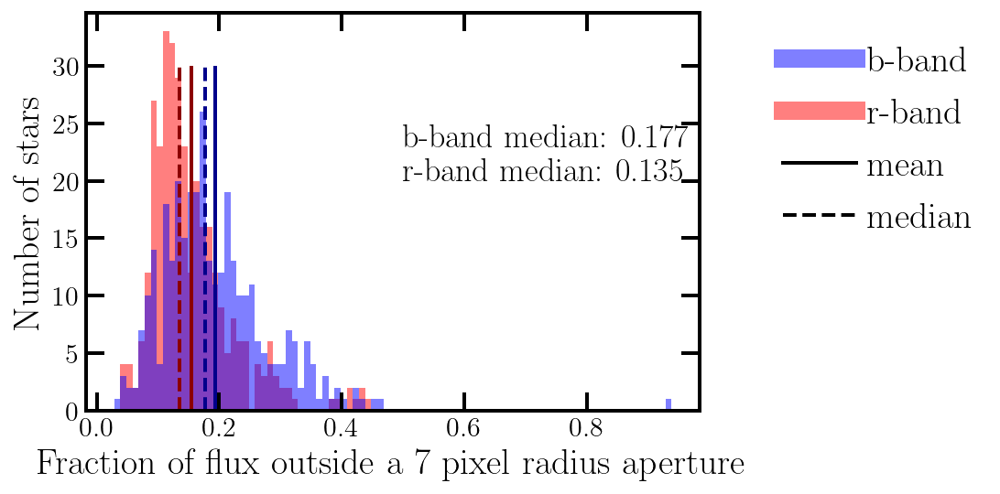

In [101]:
 #---------------------------------------------------------------------------------

# Plot the fraction of flux in aperture of size ~5 pixels for each star given a certain threshold
# Plot this in terms of magnitudes 

flux_fracs_all_r = []
flux_fracs_all_b = []
flux_levels_all_r = []
flux_levels_all_b = []


# Loop through stars (aper_sum)
for star_apers,band,star_cat in zip([aper_sums_all_r, aper_sums_all_b],['r','b'],[cat_magcal_sci_r, cat_magcal_sci_b]):
    for aper_sum, star_num in zip(star_apers,star_cat['id']):
        # Calculate the derivative of the flux
        flux_der = np.diff(aper_sum) / np.diff(radii)

        # Find the aperture radius where the derivative crosses zero (or meets other threshold)
        # Estimate the flux at that radius
        if len(np.where(np.diff(np.sign(flux_der)))[0]) == 0:
            flux_level = max(aper_sum)

        else:
            zero_crossing = np.where(np.diff(np.sign(flux_der)))[0][0]
            flux_level = aper_sum[zero_crossing+1]

        # Find the fraction of the flux missing at an aperture radius of 3 pixels
        flux_fraction = 1 - (aper_sum[np.where(radii==chosen_aper)] / flux_level)
        
        if band =='r': 
            flux_fracs_all_r.append(flux_fraction)
            flux_levels_all_r.append(flux_level)
        else:
            flux_fracs_all_b.append(flux_fraction)
            flux_levels_all_b.append(flux_level)

flux_mean_all_r = np.mean(flux_fracs_all_r)
flux_median_all_r = np.median(flux_fracs_all_r)
flux_mean_all_b = np.mean(flux_fracs_all_b)
flux_median_all_b = np.median(flux_fracs_all_b) 

# Find best bins
min_bin = min(flux_fracs_all_r) - 0.01
max_bin = max(flux_fracs_all_b) + 0.01

#plt.hist(np.asarray(flux_fracs))
plt.xlabel(f'Fraction of flux outside a {chosen_aper} pixel radius aperture',fontsize=20)
plt.ylabel('Number of stars',fontsize=20)
plt.hist(np.asarray(flux_fracs_all_r),color='red',bins=np.arange(min_bin,max_bin,0.01),alpha=0.5,label='r-band');
plt.hist(np.asarray(flux_fracs_all_b),color='blue',bins=np.arange(min_bin,max_bin,0.01),alpha=0.5,label='b-band');
plt.vlines(flux_mean_all_r,0,30,color='darkred',lw=2)
plt.vlines(flux_mean_all_b,0,30,color='darkblue',lw=2)
plt.vlines(flux_median_all_r,0,30,color='darkred',lw=2,linestyle='dashed')
plt.vlines(flux_median_all_b,0,30,color='darkblue',lw=2,linestyle='dashed')
custom_lines = [Line2D([0], [0], color='blue', lw=10, alpha=0.5),
                Line2D([0], [0], color='red', lw=10, alpha=0.5),
                Line2D([0], [0], color='black', lw=2),
                Line2D([0], [0], color='black', lw=2, linestyle='dashed')]

plt.legend(custom_lines, ['b-band','r-band','mean', 'median'],fontsize=20,bbox_to_anchor=(1.5, 1))
plt.text(.5,20,f'b-band median: {round(flux_median_all_b,3)}\nr-band median: {round(flux_median_all_r,3)}',fontsize=18)
plt.savefig(os.path.join(in_dir,f'diagnostic-plots/fluxfraction_{chosen_aper}pix_all.png'),overwrite=True)

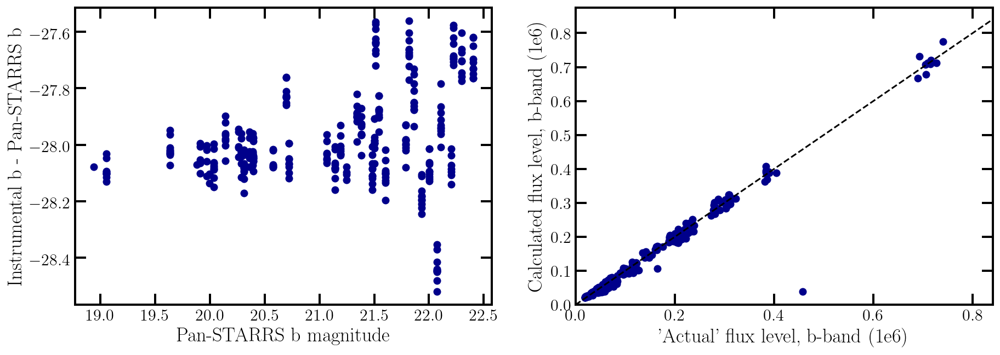

<Figure size 432x288 with 0 Axes>

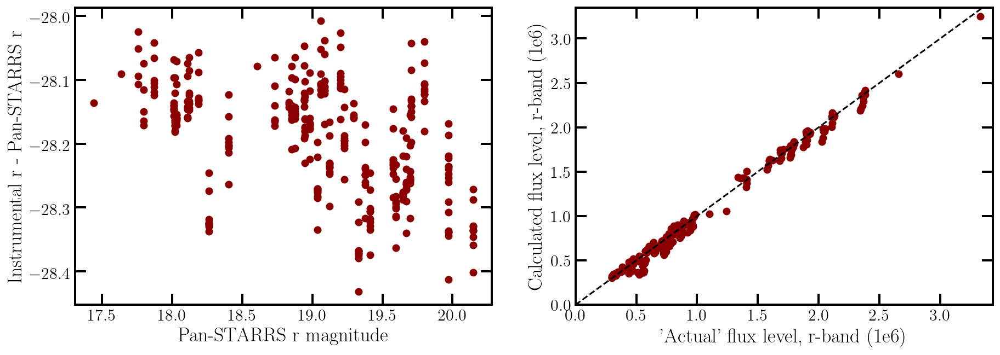

<Figure size 432x288 with 0 Axes>

In [102]:
## Compare mags to Pan-STARRS
aper_ind = np.where(radii==chosen_aper)[0][0]
new_mag_name = 'aper_corrected_mag_all'

stars_sci_all_b = compare_mags(aper_sums_all_b,aper_ind,cat_magcal_sci_b,cat_magcal_sci_p,flux_median_all_b,flux_levels_all_b,'b',new_mag_name=new_mag_name)
stars_sci_all_r = compare_mags(aper_sums_all_r,aper_ind,cat_magcal_sci_r,cat_magcal_sci_p,flux_median_all_r,flux_levels_all_r,'r',new_mag_name=new_mag_name)
stars_sci_all_p = cat_magcal_sci_p

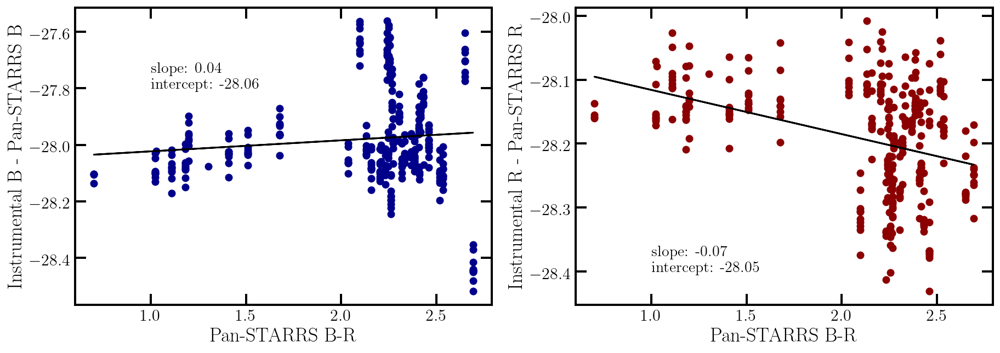

<Figure size 432x288 with 0 Axes>

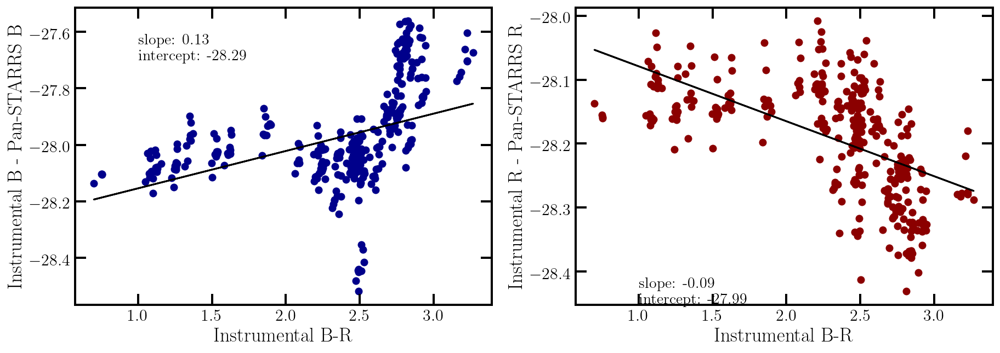

<Figure size 432x288 with 0 Axes>

In [103]:
count = 0
fig,ax = plt.subplots(1,2,figsize=(15,5))
fit = fitting.LinearLSQFitter()
line_init = models.Linear1D()


x = stars_sci_all_p['B-BESSEL_linear'] - stars_sci_all_p['R-BESSEL_linear']
y_r = stars_sci_all_r[new_mag_name] - stars_sci_all_p['R-BESSEL_linear']
y_b = stars_sci_all_b[new_mag_name] - stars_sci_all_p['B-BESSEL_linear']

# B-band first
ax[0].scatter(x,y_b,color='darkblue')
#ax[0].set_xlim(1,3)
ax[0].set_xlabel(f'Pan-STARRS B-R')
ax[0].set_ylabel(f'Instrumental B - Pan-STARRS B')
fitted_line_pan_all_b = fit(line_init, x, y_b)
ax[0].plot(x, fitted_line_pan_all_b(x), 'k-', label='Fitted Model')
ax[0].text(1.0,-27.8,f'slope: {round(fitted_line_pan_all_b.slope.value, 2)}\nintercept: {round(fitted_line_pan_all_b.intercept.value, 2)}',fontsize=14)
# Now R-band
ax[1].scatter(x,y_r,color='darkred')
#ax[1].set_xlim(1,3)
ax[1].set_xlabel(f'Pan-STARRS B-R')
ax[1].set_ylabel(f'Instrumental R - Pan-STARRS R')
fitted_line_pan_all_r = fit(line_init, x, y_r)
ax[1].plot(x, fitted_line_pan_all_r(x), 'k-', label='Fitted Model')
ax[1].text(1.0,-28.4,f'slope: {round(fitted_line_pan_all_r.slope.value, 2)}\nintercept: {round(fitted_line_pan_all_r.intercept.value, 2)}',fontsize=14)

plt.savefig(os.path.join(in_dir,f'diagnostic-plots/color_terms_after_aper_corrections_pan_all.png'))
plt.show()
plt.clf()



x = stars_sci_all_b[new_mag_name] - stars_sci_all_r[new_mag_name]
y_r = stars_sci_all_r[new_mag_name] - stars_sci_all_p['R-BESSEL_linear']
y_b = stars_sci_all_b[new_mag_name] - stars_sci_all_p['B-BESSEL_linear']
# B-band
ax[0].scatter(x,y_b,color='darkblue')
ax[0].set_xlabel(f'Instrumental B-R')
ax[0].set_ylabel(f'Instrumental B - Pan-STARRS B')
#ax[0].set_xlim(1,3)
fitted_line_inst_all_b = fit(line_init, x, y_b)
ax[0].plot(x, fitted_line_inst_all_b(x), 'k-', label='Fitted Model')
ax[0].text(1.0,-27.7,f'slope: {round(fitted_line_inst_all_b.slope.value, 2)}\nintercept: {round(fitted_line_inst_all_b.intercept.value, 2)}',fontsize=14)
#R-band
ax[1].scatter(x,y_r,color='darkred')
ax[1].set_xlabel(f'Instrumental B-R')
ax[1].set_ylabel(f'Instrumental R - Pan-STARRS R')
#ax[1].set_xlim(1,3)
fitted_line_inst_all_r = fit(line_init, x, y_r)
ax[1].plot(x, fitted_line_inst_all_r(x), 'k-', label='Fitted Model')
ax[1].text(1.0,-28.45,f'slope: {round(fitted_line_inst_all_r.slope.value, 2)}\nintercept: {round(fitted_line_inst_all_r.intercept.value, 2)}',fontsize=14)


plt.savefig(os.path.join(in_dir,f'diagnostic-plots/color_terms_after_aper_corrections_inst_{chosen_aper}pix_all.png'))
plt.show()
plt.clf()

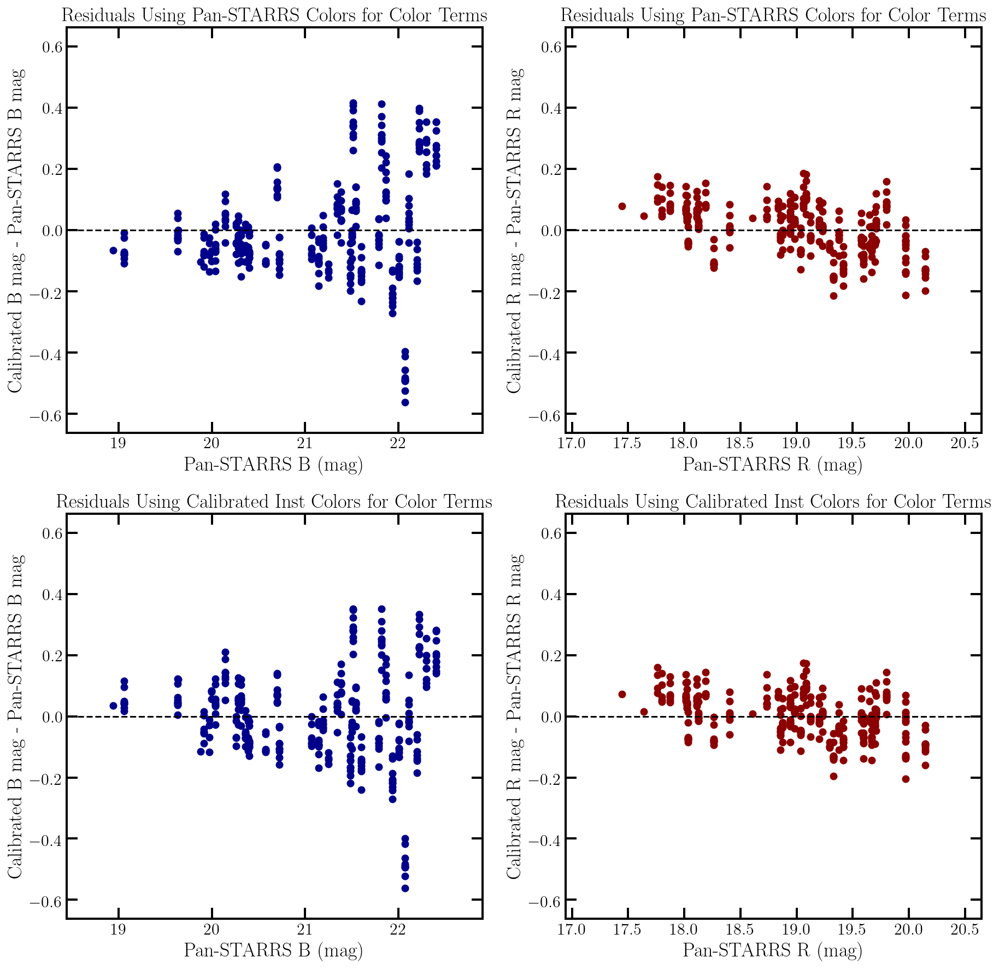

In [104]:
# Calculate color corrected mags for aperture corrected stars
mag_color_corrected_pan_r = []
mag_color_corrected_pan_b = []
mag_color_corrected_inst_r = []
mag_color_corrected_inst_b = []

for star_r, star_b, star_p in zip(stars_sci_all_r,stars_sci_all_b,stars_sci_all_p):
    x_p = star_p['B-BESSEL_linear'] - star_p['R-BESSEL_linear']
    x_inst = star_b[new_mag_name] - star_r[new_mag_name]
    mag_color_corrected_pan_r.append( star_r[new_mag_name] - fitted_line_pan_all_r(x_p) )
    mag_color_corrected_pan_b.append( star_b[new_mag_name] - fitted_line_pan_all_b(x_p) )
    mag_color_corrected_inst_r.append( star_r[new_mag_name] - fitted_line_inst_all_r(x_inst) )
    mag_color_corrected_inst_b.append( star_b[new_mag_name] - fitted_line_inst_all_b(x_inst) )
    
stars_sci_all_r['mag_aper_color_corrected_pan_all'] = mag_color_corrected_pan_r
stars_sci_all_r['mag_aper_color_corrected_inst_all'] = mag_color_corrected_inst_r
stars_sci_all_b['mag_aper_color_corrected_pan_all'] = mag_color_corrected_pan_b
stars_sci_all_b['mag_aper_color_corrected_inst_all'] = mag_color_corrected_inst_b


fig,ax = plt.subplots(2,2,figsize=(15,15))
x = stars_sci_all_p['B-BESSEL_linear']
y = stars_sci_all_b['mag_aper_color_corrected_pan_all'] - stars_sci_all_p['B-BESSEL_linear']
ylim = max([abs(min(y)),abs(max(y))])
ax[0][0].scatter(x,y,color='darkblue')
ax[0][0].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[0][0].set_xlim(min(x)-0.5,max(x)+0.5)
ax[0][0].set_ylim(-ylim-0.1,ylim+0.1)
ax[0][0].set_xlabel('Pan-STARRS B (mag)')
ax[0][0].set_ylabel('Calibrated B mag - Pan-STARRS B mag')
ax[0][0].title.set_text('Residuals Using Pan-STARRS Colors for Color Terms')

x = stars_sci_all_p['R-BESSEL_linear']
y = stars_sci_all_r['mag_aper_color_corrected_pan_all'] - stars_sci_all_p['R-BESSEL_linear']
ax[0][1].scatter(x,y,color='darkred')
ax[0][1].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[0][1].set_xlim(min(x)-0.5,max(x)+0.5)
ax[0][1].set_ylim(-ylim-0.1,ylim+0.1)
ax[0][1].set_xlabel('Pan-STARRS R (mag)')
ax[0][1].set_ylabel('Calibrated R mag - Pan-STARRS R mag')
ax[0][1].title.set_text('Residuals Using Pan-STARRS Colors for Color Terms')

x = stars_sci_all_p['B-BESSEL_linear']
y = stars_sci_all_b['mag_aper_color_corrected_inst_all'] - stars_sci_all_p['B-BESSEL_linear']
ax[1][0].scatter(x,y,color='darkblue')
ax[1][0].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[1][0].set_xlim(min(x)-0.5,max(x)+0.5)
ax[1][0].set_ylim(-ylim-0.1,ylim+0.1)
ax[1][0].set_xlabel('Pan-STARRS B (mag)')
ax[1][0].set_ylabel('Calibrated B mag - Pan-STARRS B mag')
ax[1][0].title.set_text('Residuals Using Calibrated Inst Colors for Color Terms')

x = stars_sci_all_p['R-BESSEL_linear']
y = stars_sci_all_r['mag_aper_color_corrected_inst_all'] - stars_sci_all_p['R-BESSEL_linear']
ax[1][1].scatter(x,y,color='darkred')
ax[1][1].plot(np.arange(30),np.zeros(30),linestyle='dashed', color='black')
ax[1][1].set_xlim(min(x)-0.5,max(x)+0.5)
ax[1][1].set_ylim(-ylim-0.1,ylim+0.1)
ax[1][1].set_xlabel('Pan-STARRS R (mag)')
ax[1][1].set_ylabel('Calibrated R mag - Pan-STARRS R mag')
ax[1][1].title.set_text('Residuals Using Calibrated Inst Colors for Color Terms')

plt.savefig(os.path.join(out_dir,f'residuals_after_aper_color_corrections_{chosen_aper}pix_all.png'))

In [ ]:
# Okay, now we've looked at a few selected stars. 
# Now we want to apply what we learned from them to the rest of the catalog. 

def apply_aperture_corrections()

    return

def apply_color_terms(r_cat, b_cat, p_cat, slope_r, intercept_r, slope_b, intercept_b):
    
    
    
    return r_corrected, b_corrected

use_inst = True

if use_inst:
    slope_r = slope_inst_r
    intercept_r = intercept_inst_r
    slope_b = slope_inst_b
    intercept_b = intercept_inst_b
else:
    slope_r = slope_pan_r
    intercept_r = intercept_pan_r
    slope_b = slope_pan_b
    intercept_b = intercept_pan_b

cat_all_sci_r, cat_all_sci_b = apply_color_terms(cat_all_sci_r,cat_all_sci_b,cat_all_sci_p,slope_r,intercept_r,slope_b,intercept_b)

In [17]:
'''
ind_r = []
ind_b = []
count_r = 0
for row in stars_sci_pr:
    if row in stars_sci_pb:
        ind_r.append(count_r)
        count_b = np.where(row == stars_sci_pb)[0][0]
        ind_b.append(count_b)
    count_r += 1
print(ind_r,ind_b)

#stars_sci_pr[ind_r]
'''

stars_sci_pb == stars_sci_pr

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17] [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

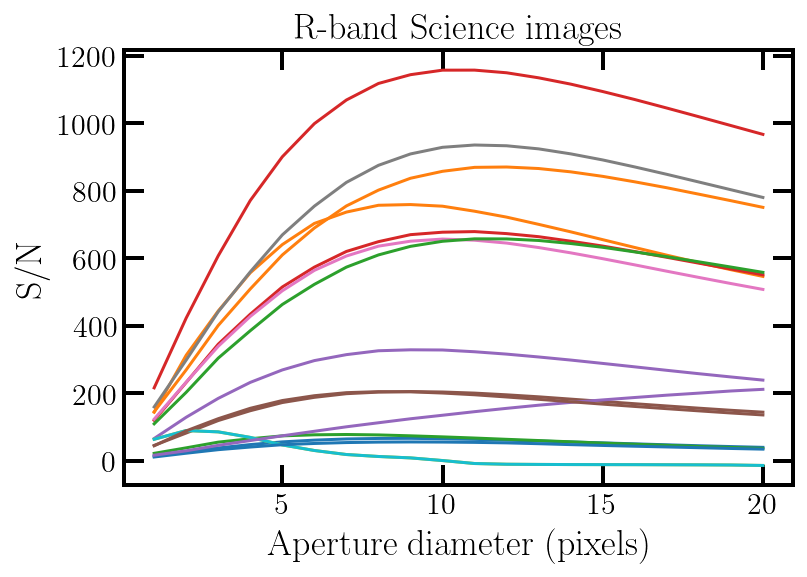

In [10]:
x=[]
for string in apers_diameter:
    x.append(int(string))
x = np.asarray(x)   

for star in cat_all_sci_r:
    
    y = []
    for i in range(len(x)):
        y.append(star[f'S/N_{str(i)}'])
    y = np.asarray(y)
    
    plt.plot(x,y)
plt.xlabel('Aperture diameter (pixels)')
plt.ylabel('S/N')
plt.title('R-band Science images')
plt.savefig(in_dir+'signal_to_noise_sci_r.png')

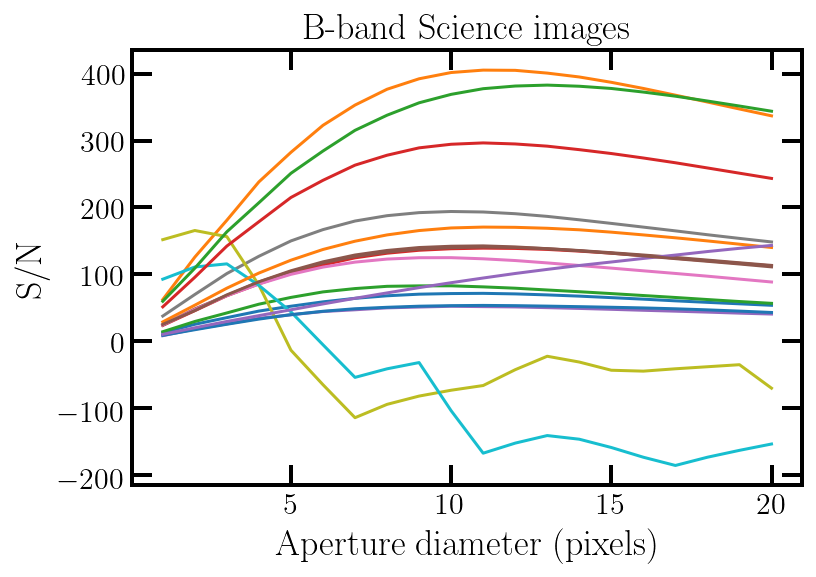

In [11]:
x=[]
for string in apers_diameter:
    x.append(int(string))
x = np.asarray(x)   

for star in cat_all_sci_b:
    
    y = []
    for i in range(len(x)):
        y.append(star[f'S/N_{str(i)}'])
    y = np.asarray(y)
    
    plt.plot(x,y)
plt.xlabel('Aperture diameter (pixels)')
plt.ylabel('S/N')
plt.title('B-band Science images')
plt.savefig(in_dir+'signal_to_noise_sci_b.png')

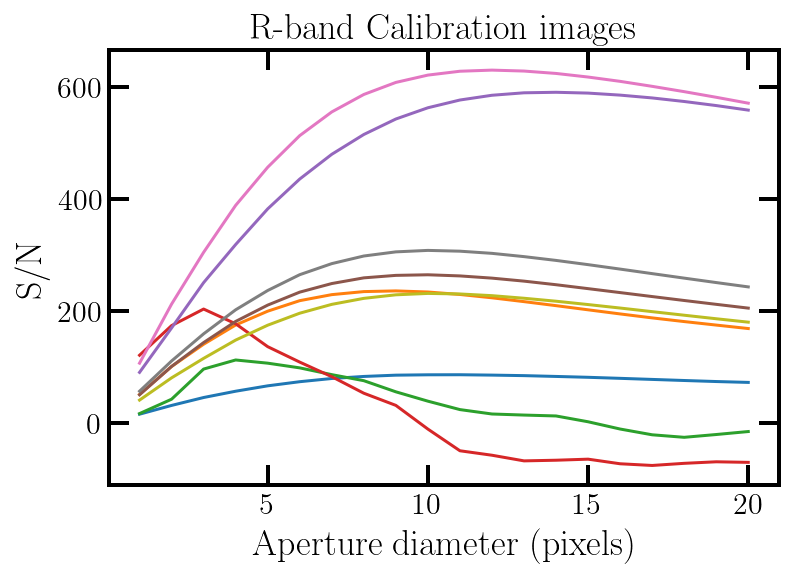

In [12]:
x=[]
for string in apers_diameter:
    x.append(int(string))
x = np.asarray(x)   

for star in cat_all_cali_r:
    
    y = []
    for i in range(len(x)):
        y.append(star[f'S/N_{str(i)}'])
    y = np.asarray(y)
    
    plt.plot(x,y)
plt.xlabel('Aperture diameter (pixels)')
plt.ylabel('S/N')
plt.title('R-band Calibration images')
plt.savefig(in_dir+'signal_to_noise_cali_r.png')

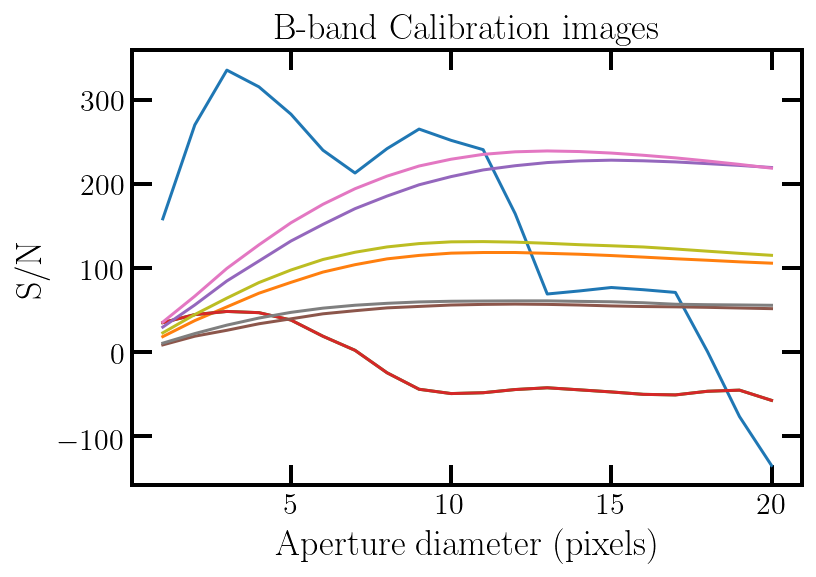

In [13]:
x=[]
for string in apers_diameter:
    x.append(int(string))
x = np.asarray(x)   

for star in cat_all_cali_b:
    
    y = []
    for i in range(len(x)):
        y.append(star[f'S/N_{str(i)}'])
    y = np.asarray(y)
    
    plt.plot(x,y)
plt.xlabel('Aperture diameter (pixels)')
plt.ylabel('S/N')
plt.title('B-band Calibration images')
plt.savefig(in_dir+'signal_to_noise_cali_b.png')

In [9]:
cat_all_sci_r[cat_all_sci_r['id']==274]

X_IMAGE,Y_IMAGE,FLUX_AUTO,FLUX_RADIUS,FWHM_IMAGE,A_IMAGE,B_IMAGE,THETA_IMAGE,FLAGS,ALPHA_J2000,DELTA_J2000,ISOAREA_IMAGE,FLUX_APER,FLUX_APER_1,FLUX_APER_2,FLUX_APER_3,FLUX_APER_4,FLUX_APER_5,FLUX_APER_6,FLUX_APER_7,FLUX_APER_8,FLUX_APER_9,FLUX_APER_10,FLUX_APER_11,FLUX_APER_12,FLUX_APER_13,FLUX_APER_14,FLUX_APER_15,FLUX_APER_16,FLUX_APER_17,FLUX_APER_18,FLUX_APER_19,filename,mag_inst,id
pix,pix,ct,pix,pix,pix,pix,deg,,deg,deg,pix2,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,ct,,ct,
float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str56,float64,int64
1647.642,728.689,2030949.0,3.67,6.33,3.585,3.461,16.2,0,137.5283315,73.3124729,473,28176.66,115347.4,242077.5,412450.1,588490.6,780040.0,957328.9,1125130.0,1271429.0,1398231.0,1504768.0,1596321.0,1671734.0,1736440.0,1788749.0,1834280.0,1871575.0,1904038.0,1931418.0,1955467.0,lbcr.20191220.071459-chip2_backsub_M81blob.proc_reg.fits,-8.45220402108029,274


In [115]:
t = Table()
t['a'] = [1, 4, 9]
t['b'] = [2.0, 5.0, 1.5]
t['c'] = ['x', 'y', 'z']
s = Table()
s['a'] = [1, 3, 4, 9]
s['b'] = [2.0, 1.5, 5.0, 0.1]
s['c'] = ['x', 'f','y', 'p']
print('Table t: \n',t,'\n\nTable s:\n',s)

Table t: 
  a   b   c 
--- --- ---
  1 2.0   x
  4 5.0   y
  9 1.5   z 

Table s:
  a   b   c 
--- --- ---
  1 2.0   x
  3 1.5   f
  4 5.0   y
  9 0.1   p


In [127]:
ind_s = []
ind_t = []
count_s = 0
for row in s:
    if row in t:
        ind_s.append(count_s)
        count_t = np.where(row == t)[0][0]
        ind_t.append(count_t)
    count_s += 1
print(ind_s,ind_t)

[0, 2] [0, 1]


In [123]:
s[2] in t

True

In [126]:
np.where(s[2] == t)

(array([1]),)

In [110]:
np.sum(cutout.data > 65536)

0

In [118]:
arr=np.array([1,2,3,4])
mask=np.array([False,False,True,False])
mask1=np.array([])
print(arr[mask],arr[~mask])

[3] [1 2 4]


In [117]:
~mask

array([-2])

In [112]:
ra_aper = [137.7236283,137.7581456,137.4735873,137.4222099,137.4735873,137.4143579,137.4039429,137.6692856,137.6534977,137.7192012,137.4845199,137.6640354,137.6196284,137.4230031,137.5283300,137.5879568,137.4206052,137.4306692,137.7192012,137.4389020]
dec_aper = [73.3228615,73.3256727,73.3001069,73.3058574,73.3001069,73.4010486,73.4222730,73.4939572,73.4902412,73.4835457,73.4556498,73.3700219,73.3548676,73.3587842,73.3124673,73.2930358,73.2909078,73.2854915,73.4835457,73.5412225]
len(dec_aper)

20

In [111]:
137.4735873 in ra_aper

False